# **`Name: Himank Deo`**
# **`E-Mail: deo.himank@gmail.com`**

#  

# ``THE PROBLEM STATEMENT OVERVIEW:``

Walmart has `multiple stores across the country`, and they keep running into a classic business nightmare - `too much stock when nobody's buying, too little when everyone wants it.`

Your job? Dig into their historical sales data, figure out `what drives sales up or down` (weather? economy? holidays?), identify their best and worst stores, and `then predict what the next 12 weeks of sales will look like` - so they can stock their shelves perfectly.


## ``Dataset Information``

1). **`Store`** – Unique store identifier used for store-level performance analysis and forecasting.

2). **`Date`** – Weekly timestamp used for trend, seasonality detection, and time series modeling.

3). **`Weekly_Sales`** – Total weekly revenue used for analysis and demand forecasting.

4). **`Holiday_Flag`** – Indicator of holiday weeks used to measure seasonal demand impact.

5). **`Temperature`** – Regional temperature data used to evaluate weather influence on sales.

6). **`Fuel_Price`** – Regional fuel cost used to analyze its effect on customer mobility and spending.

7). **`CPI (Consumer Price Index)`** - used to assess inflation impact on purchasing behavior.

8). **`Unemployment`** – Regional unemployment rate used to study economic influence on retail demand.

### **Importing Libraries**

In [115]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.preprocessing import *
le=LabelEncoder()
sc=StandardScaler()
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore',ConvergenceWarning)
from pmdarima import auto_arima
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import mean_absolute_error, mean_squared_error

### **Load Dataset**

In [116]:
df=pd.read_csv('Walmart DataSet.csv')

In [117]:
df

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106
...,...,...,...,...,...,...,...,...
6430,45,28-09-2012,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,05-10-2012,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,12-10-2012,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,19-10-2012,718125.53,0,56.47,3.969,192.330854,8.667


### **Data Inspection**

In [118]:
df.shape

(6435, 8)

In [119]:
df.info()

<class 'pandas.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   str    
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), str(1)
memory usage: 402.3 KB


**`Insights`**
- We have total stores is 45 
- Weeks per store is 143
- Total rows 6435
- Total time period is 2 years 9 months

### **EDA : Exploratory Data Analysis**

In [120]:
# Converting date column into datatime dtype
df['Date'] = pd.to_datetime(df['Date'], format='%d-%m-%Y')

In [121]:
# Converting Temperature column into Celsius from Fahrenheit

def temp_celsius(temp):
    return(temp -32)* 5/9

In [122]:
df.info()

<class 'pandas.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Store         6435 non-null   int64         
 1   Date          6435 non-null   datetime64[us]
 2   Weekly_Sales  6435 non-null   float64       
 3   Holiday_Flag  6435 non-null   int64         
 4   Temperature   6435 non-null   float64       
 5   Fuel_Price    6435 non-null   float64       
 6   CPI           6435 non-null   float64       
 7   Unemployment  6435 non-null   float64       
dtypes: datetime64[us](1), float64(5), int64(2)
memory usage: 402.3 KB


In [123]:
df.describe()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
count,6435.000000,6435,6.435000e+03,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000
mean,23.000000,2011-06-17 00:00:00,1.046965e+06,0.069930,60.663782,3.358607,171.578394,7.999151
min,1.000000,2010-02-05 00:00:00,2.099862e+05,0.000000,-2.060000,2.472000,126.064000,3.879000
25%,12.000000,2010-10-08 00:00:00,5.533501e+05,0.000000,47.460000,2.933000,131.735000,6.891000
50%,23.000000,2011-06-17 00:00:00,9.607460e+05,0.000000,62.670000,3.445000,182.616521,7.874000
75%,34.000000,2012-02-24 00:00:00,1.420159e+06,0.000000,74.940000,3.735000,212.743293,8.622000
max,45.000000,2012-10-26 00:00:00,3.818686e+06,1.000000,100.140000,4.468000,227.232807,14.313000
std,12.988182,NaN,5.643666e+05,0.255049,18.444933,0.459020,39.356712,1.875885


In [124]:
df.isna().sum()

Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64

In [125]:
df.duplicated().sum()

np.int64(0)

In [126]:
df

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106
...,...,...,...,...,...,...,...,...
6430,45,2012-09-28,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,2012-10-05,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,2012-10-12,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,2012-10-19,718125.53,0,56.47,3.969,192.330854,8.667


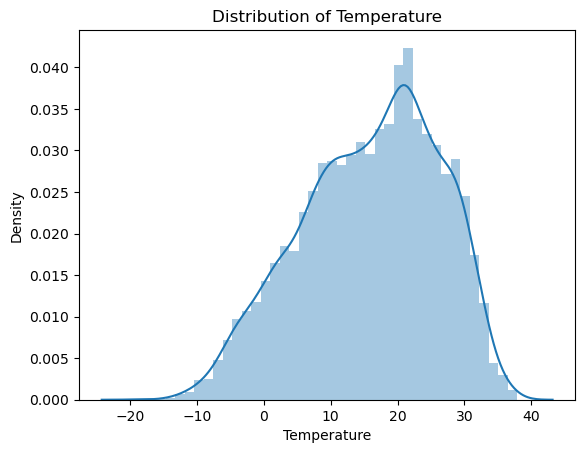

In [127]:
temp_c = temp_celsius(df['Temperature'])

plt.title('Distribution of Temperature')
sns.distplot(temp_c, bins = 40)
plt.show()

**`Insight from Analysis`**:

- Most of the Temperature are btw `5 degree celsius to 3 degree celsius`
- `peak around 15 - 20c`
- slightly right skew

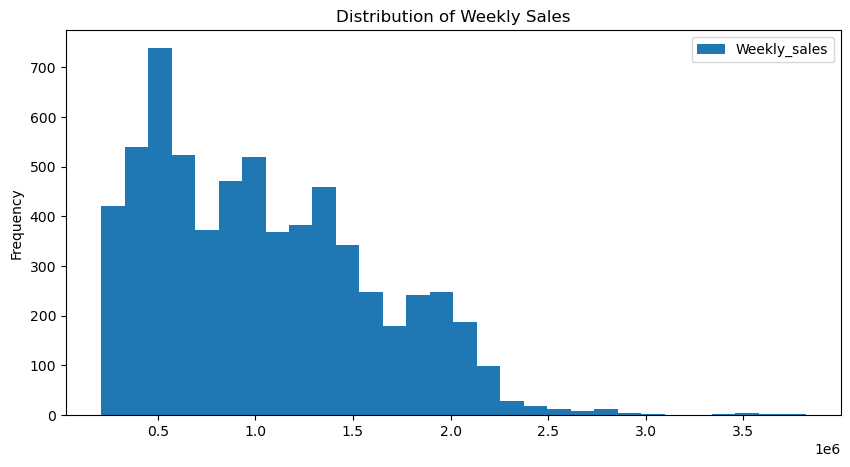

In [128]:
# Checking trends
df['Weekly_Sales'].plot(kind = 'hist', bins = 30, label = 'Weekly_sales', figsize = (10,5))
plt.title('Distribution of Weekly Sales')
plt.legend()

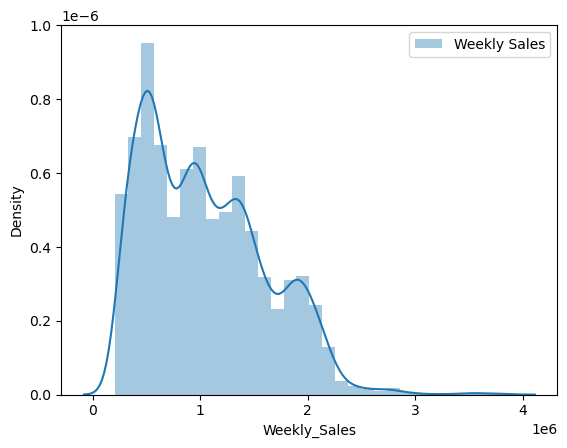

In [129]:
sns.distplot(df['Weekly_Sales'], kde = True, bins = 30, label = 'Weekly Sales')
plt.legend()
plt.show()

**`Insight from Analysis`**:

* most of the high sales are between `0.4 million to 1.5 million`.
* very high sales `(above 2.5M)` are rare.
* Distribution is `slightly right skewed`.

In [130]:
df['Store'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45])

In [131]:
df['Holiday_Flag'].value_counts()

Holiday_Flag
0    5985
1     450
Name: count, dtype: int64

In [132]:
df.reset_index().set_index(['Date'],inplace=True)

In [133]:
df

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106
...,...,...,...,...,...,...,...,...
6430,45,2012-09-28,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,2012-10-05,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,2012-10-12,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,2012-10-19,718125.53,0,56.47,3.969,192.330854,8.667


In [134]:
df['CPI'].sort_values(ascending =False)

1286    227.232807
1285    227.214288
1284    227.169392
1143    227.036936
1142    227.018417
           ...    
4603    126.064000
2315    126.064000
4746    126.064000
1600    126.064000
5318    126.064000
Name: CPI, Length: 6435, dtype: float64

In [135]:
df['Temperature'].sort_values()

910      -2.06
3626      5.54
2336      6.23
959       7.46
5628      9.51
         ...  
5315     99.22
1597     99.22
4657     99.66
4707    100.07
4599    100.14
Name: Temperature, Length: 6435, dtype: float64

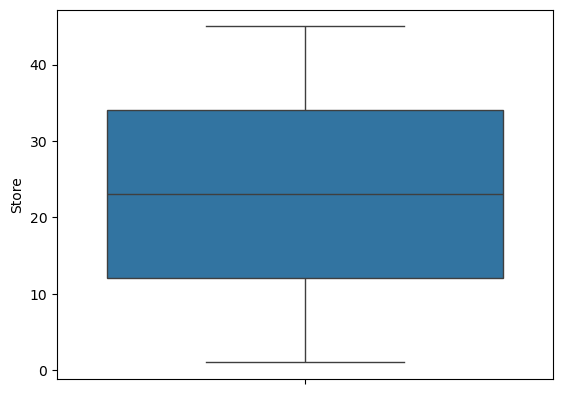

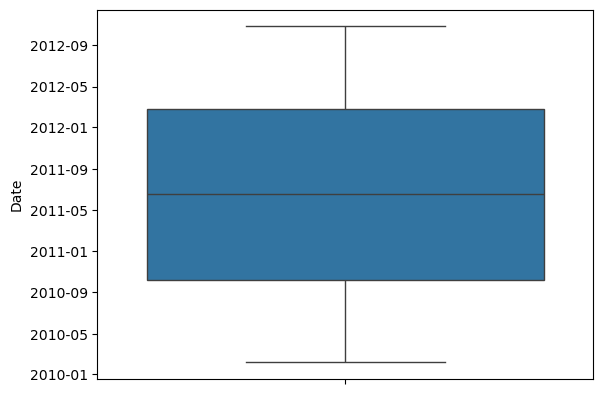

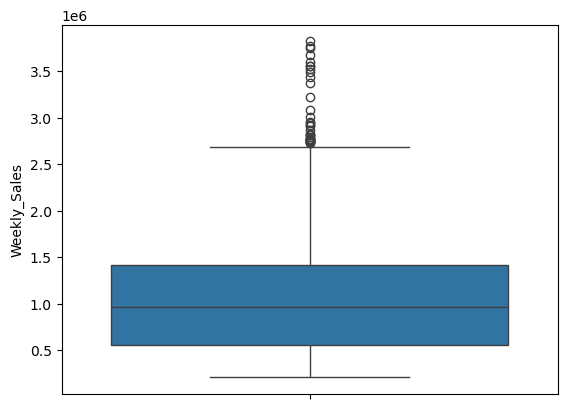

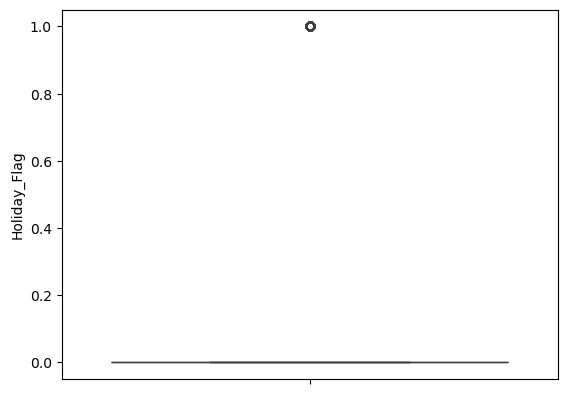

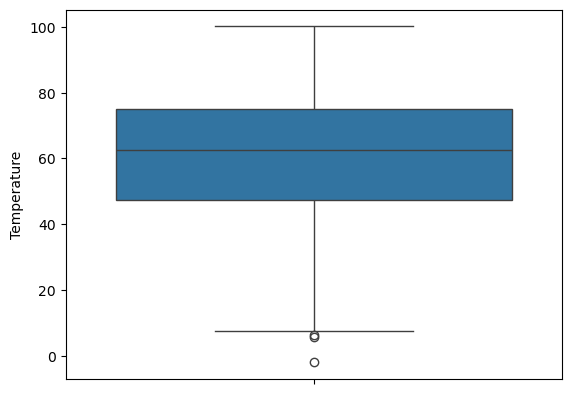

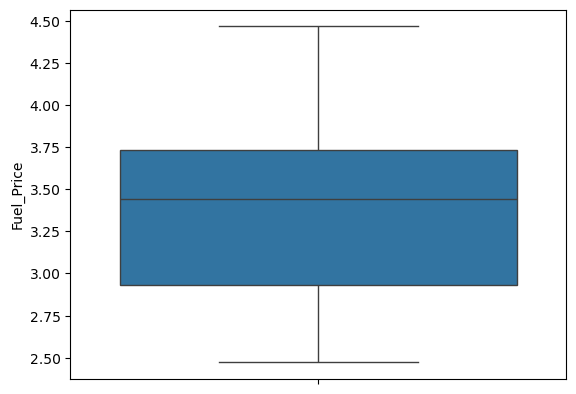

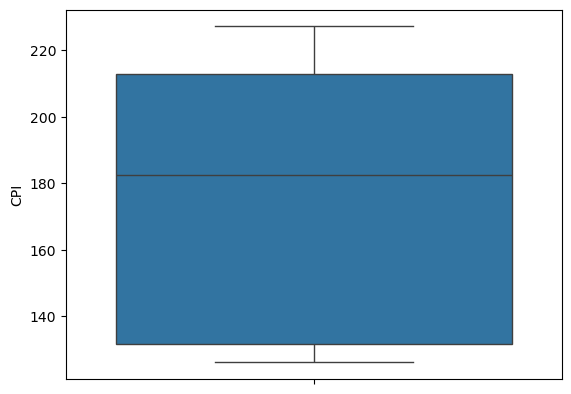

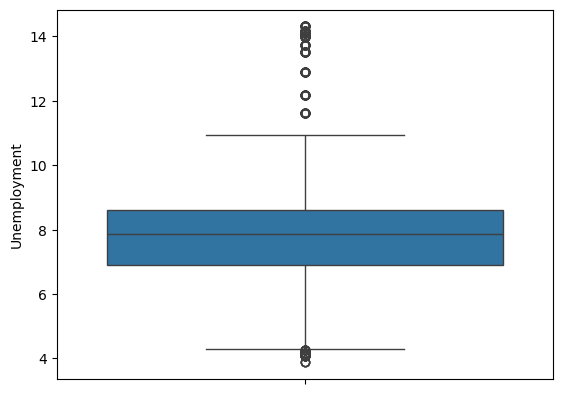

In [136]:
for i in df.columns:
    sns.boxplot(df[i])
    plt.show()


**`Insight from Analysis`**
- As we can see some of the stores have more sales than others
- Some of the stores take holidays but most od them still working
- Most of the store having constant unemployement rate but some of them have higher rate of unemployment
- As per the dataset only 1 store of walmart is having temperature below 0 while some of them havinng temperature above 80
- Fuel price dont have any extreme values

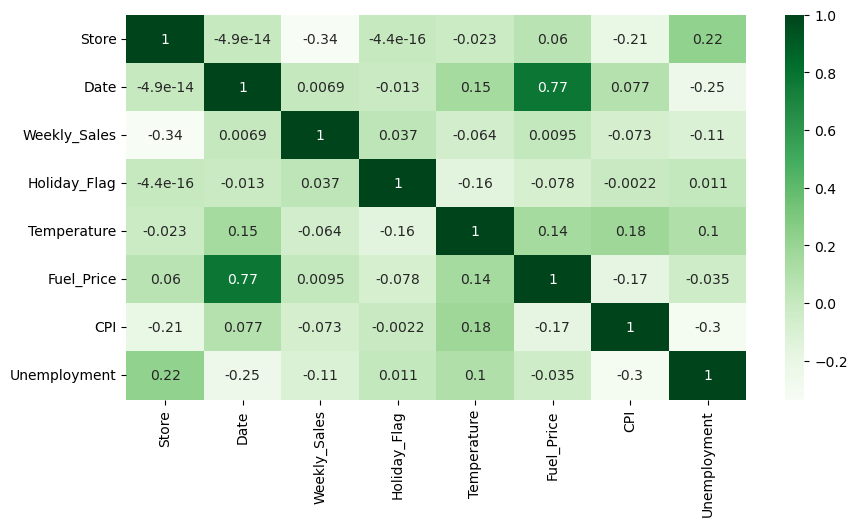

In [137]:
plt.figure(figsize=(10,5))
sns.heatmap(df.corr(),annot= True, cmap="Greens")
plt.show()

**`Insight from Analysis`**
  
* `Unemployement rate affect Weekly_sales` because it is `negatively correlated` if unemployment increases sales decreases


* Only fuel_Price is directly correlated to dates `as year passed price of fuel increase`

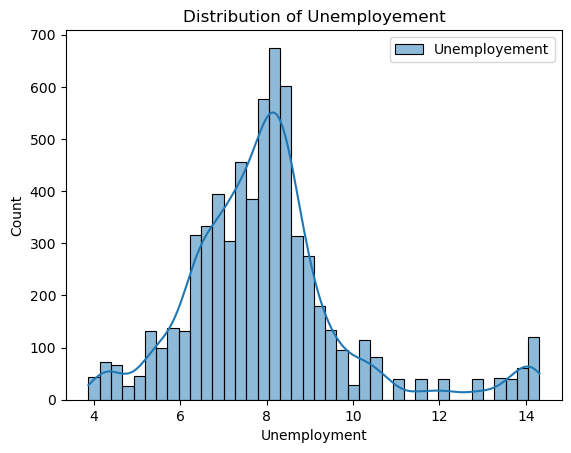

In [138]:
plt.title('Distribution of Unemployement')
sns.histplot(df['Unemployment'], kde = True, bins = 40, label = 'Unemployement')
plt.legend()
plt.show()

**`Insight from Analysis`**:

- Most of the `Unemployement` are `6% to 9%`.
- Peak is around `7-8 percent.`
- very few above are between `12% to 14%.`
- graph show's slight `right skewness`

In [139]:
corr = df[['Weekly_Sales','Unemployment']].corr()
print(corr)

              Weekly_Sales  Unemployment
Weekly_Sales      1.000000     -0.106176
Unemployment     -0.106176      1.000000


In [140]:
store_unemp = df.groupby('Store').apply(
    lambda x: x['Weekly_Sales'].corr(x['Unemployment'])
).reset_index()

store_unemp.columns = ['Store', 'Correlation']

# Stores most affected (negative correlation)
Top_U = store_unemp.sort_values('Correlation').head()
print(f"Top 5 most affected stores by unemploymennt {np.array(Top_U["Store"])}")

Top 5 most affected stores by unemploymennt [38 44 39 42 41]


**`Insight from Analysis`**
* As we can see no store is Positively co-related to unemployement.

In [141]:
df.describe().T

,count,mean,min,25%,50%,75%,max,std
Store,6435.0,23.0,1.0,12.0,23.0,34.0,45.0,12.988182
Date,6435,2011-06-17 00:00:00,2010-02-05 00:00:00,2010-10-08 00:00:00,2011-06-17 00:00:00,2012-02-24 00:00:00,2012-10-26 00:00:00,NaN
Weekly_Sales,6435.0,1046964.877562,209986.25,553350.105,960746.04,1420158.66,3818686.45,564366.622054
Holiday_Flag,6435.0,0.06993,0.0,0.0,0.0,0.0,1.0,0.255049
Temperature,6435.0,60.663782,-2.06,47.46,62.67,74.94,100.14,18.444933
Fuel_Price,6435.0,3.358607,2.472,2.933,3.445,3.735,4.468,0.45902
CPI,6435.0,171.578394,126.064,131.735,182.616521,212.743293,227.232807,39.356712
Unemployment,6435.0,7.999151,3.879,6.891,7.874,8.622,14.313,1.875885


**`Insight from Analysis`**
* On an average walmart earn 1 Million weekly from its store {1,046,965}
* On an average unemployement rate is 7.99 (approx 8)
* Avegrage temperature around the store is 47.46


In [142]:
weekly_s = df.groupby(['Date'])[['Weekly_Sales']].sum().reset_index().set_index(['Date'])

In [143]:
weekly_s

,Weekly_Sales
Date,
2010-02-05,49750740.50
2010-02-12,48336677.63
2010-02-19,48276993.78
2010-02-26,43968571.13
2010-03-05,46871470.30
...,...
2012-09-28,43734899.40
2012-10-05,47566639.31
2012-10-12,46128514.25


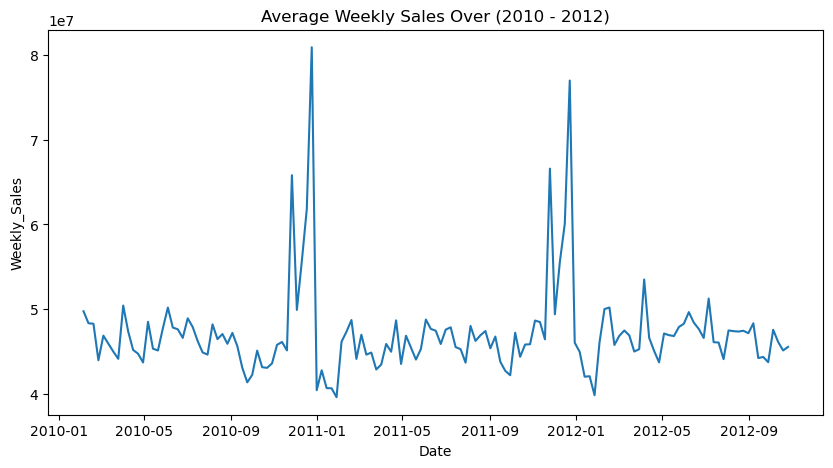

In [144]:
plt.figure(figsize=(10,5))
plt.title('Average Weekly Sales Over (2010 - 2012)')
sns.lineplot(data=weekly_s,x=weekly_s.index,y='Weekly_Sales')
plt.show()

**`Insight from Analysis`**
  
* Weekly_sales does not show upward trend it shows seasonal trend.
  
* Holiday week very high sale non holiday week less sell but in this sales at its peak just before New Year.
  
* It is an annual pattern.

In [145]:
corr = df[['Weekly_Sales','Temperature']].corr()
print(corr)

              Weekly_Sales  Temperature
Weekly_Sales       1.00000     -0.06381
Temperature       -0.06381      1.00000


In [146]:
# check every quarterly of temperature effected by weekly sales

tem_weeklysales_corr = (
    df.groupby(pd.Grouper(key = 'Date', freq='QE'))[['Weekly_Sales', 'Temperature']].corr())

tem_weeklysales_corr

Weekly_Sales  Temperature
Date                                              
2010-03-31 Weekly_Sales      1.000000    -0.066820
           Temperature      -0.066820     1.000000
2010-06-30 Weekly_Sales      1.000000    -0.012155
           Temperature      -0.012155     1.000000
2010-09-30 Weekly_Sales      1.000000    -0.059102
           Temperature      -0.059102     1.000000
2010-12-31 Weekly_Sales      1.000000    -0.206057
           Temperature      -0.206057     1.000000
2011-03-31 Weekly_Sales      1.000000    -0.007442
           Temperature      -0.007442     1.000000
2011-06-30 Weekly_Sales      1.000000    -0.004767
           Temperature      -0.004767     1.000000
2011-09-30 Weekly_Sales      1.000000    -0.065539
           Temperature      -0.065539     1.000000
2011-12-31 Weekly_Sales      1.000000    -0.149907
           Temperature      -0.149907     1.000000
2012-03-31 Weekly_Sales      1.000000    -0.024325
           Temperature      -0.024325     1.000000
2012-06-30 Weekly_Sales      1.000000    -0.062264
           Temperature      -0.062264     1.000000
2012-09-30 Weekly_Sales      1.000000    -0.067605
           Temperature      -0.067605     1.000000
2012-12-31 Weekly_Sales      1.000000    -0.107330
           Temperature      -0.107330     1.000000

<Axes: title={'center': 'Store Wise Correlation of "Sales vs temperature"'}, ylabel='Store'>

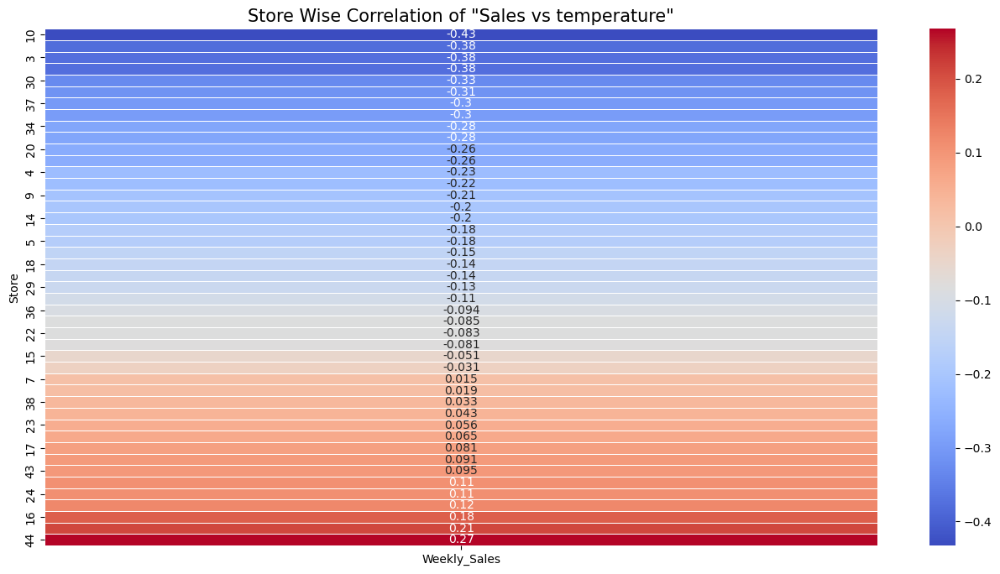

In [147]:
storeWise_sales_temp_corr = df.groupby('Store')[['Weekly_Sales','Temperature']].corr()
storeWise_sales_temp_corr = storeWise_sales_temp_corr.iloc[::2,-1].sort_values().unstack()
storeWise_sales_temp_corr = storeWise_sales_temp_corr.sort_values(by = 'Weekly_Sales' ,ascending=True)
# let's plot the result's
plt.figure(figsize = (16, 8))
plt.title('Store Wise Correlation of "Sales vs temperature"', fontsize = 15)
sns.heatmap(storeWise_sales_temp_corr, annot = True, cmap = 'coolwarm',linewidth = 0.5)

**`Insight from Analysis`**
  
* `Yes` weekly sales is affected by the temperature `as temperature increases weekly sales decreases`.
*  `Store Id 44` sales may be more sensitive to `weather conditions.` may be tis store sell `temperature sensetive items` (heating equipement/winterr clothes)

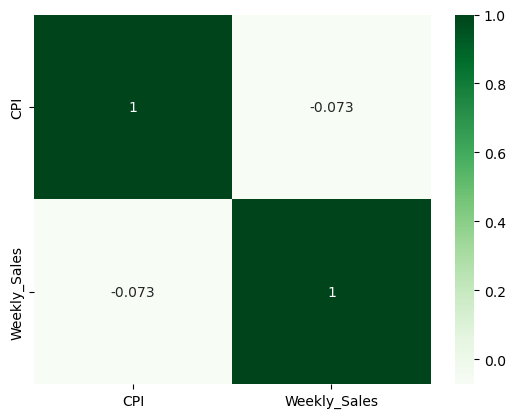

In [148]:
sns.heatmap(df[['CPI','Weekly_Sales']].corr(),annot= True, cmap="Greens")
plt.show()

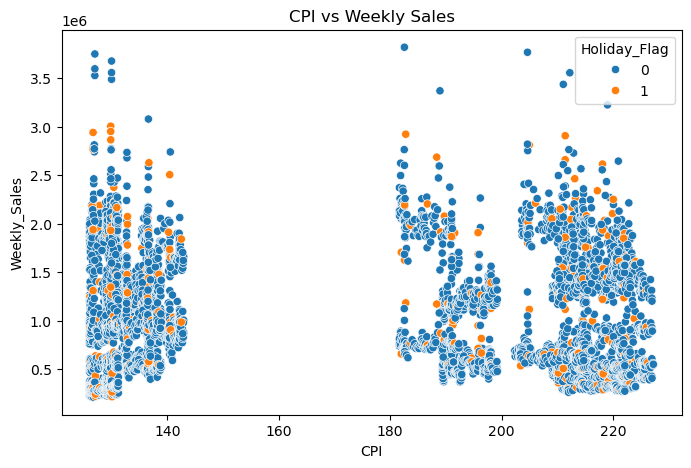

In [149]:
plt.figure(figsize=(8,5))
sns.scatterplot(data=df, x='CPI', y='Weekly_Sales', hue = 'Holiday_Flag')
plt.title("CPI vs Weekly Sales")
plt.show()

In [150]:
Storewise_cpi_sales_corr = df.groupby('Store')[['CPI', "Weekly_Sales"]].corr().iloc[::2,-1]
Storewise_cpi_sales_corr = Storewise_cpi_sales_corr.sort_values(ascending = True)

# filtered affected store's
Storewise_cpi_sales_corr = Storewise_cpi_sales_corr.head(20).unstack() 

<Axes: title={'center': 'Store-wise CPI vs weekly Sales'}, ylabel='Store'>

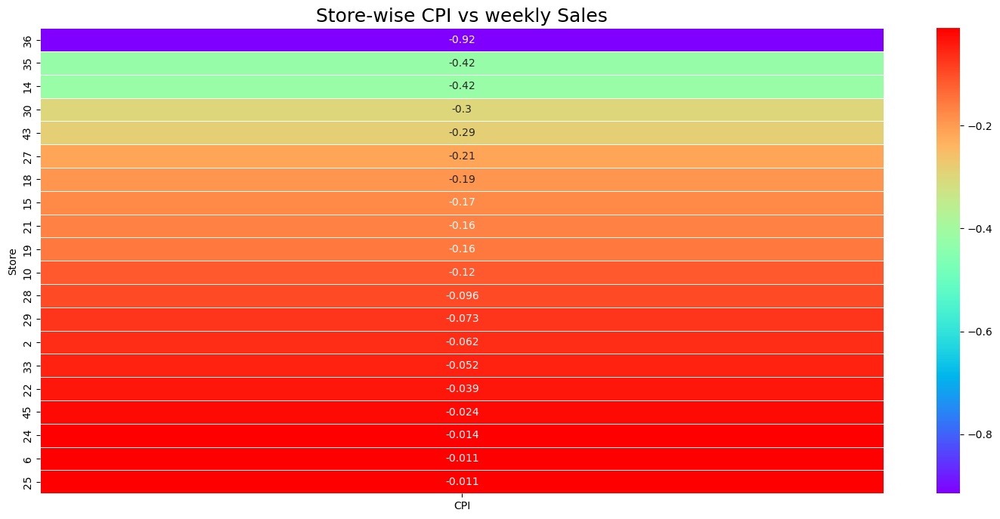

In [151]:
plt.figure(figsize =(18,8))
plt.title('Store-wise CPI vs weekly Sales', fontsize = 18)
sns.heatmap(Storewise_cpi_sales_corr,annot=True,cmap='rainbow',linewidth=0.6)

**`Insight from Analysis`**:

* `Consumer Price Index (CPI)` does not affect the weekly sales both show `slightly/mild negative correlation/Negligible`.
* This happes because CPI changes slowly over time
* High-CPI stores simply don't hit the big outlier numbers that low-CPI stores do.
* A wide gap between cluster shows this is `structural partten not noice.`
* `Here holidays` are stronger impact than CPI
* `Store ID 36` is highly affected by CPI

In [152]:
stores = pd.DataFrame(df.groupby('Store')['Weekly_Sales'].sum())
stores = stores.sort_values(by='Weekly_Sales',ascending = False)

In [153]:
stores

,Weekly_Sales
Store,
20,3.013978e+08
4,2.995440e+08
14,2.889999e+08
13,2.865177e+08
2,2.753824e+08
10,2.716177e+08
27,2.538559e+08
6,2.237561e+08
1,2.224028e+08


In [154]:
top_stores = df.groupby('Store')['Weekly_Sales'].sum().sort_values(ascending=False)


Store
20    3.013978e+08
4     2.995440e+08
14    2.889999e+08
13    2.865177e+08
2     2.753824e+08
10    2.716177e+08
27    2.538559e+08
6     2.237561e+08
1     2.224028e+08
39    2.074455e+08
Name: Weekly_Sales, dtype: float64


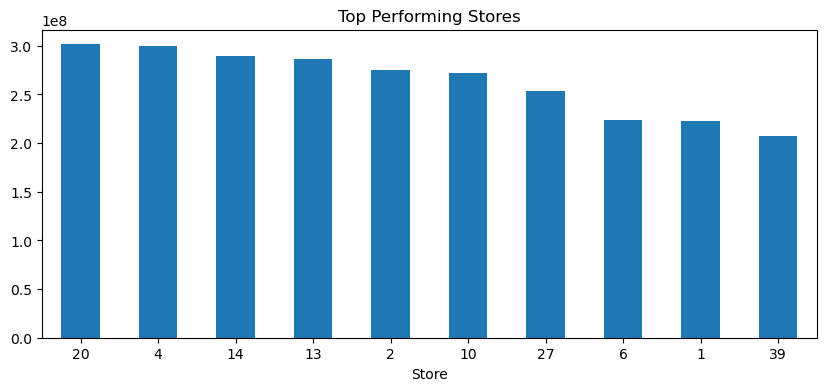

In [155]:
print(top_stores.head(10))
top_stores.head(10).plot(kind='bar', figsize=(10,4))
plt.title("Top Performing Stores")
plt.xticks(rotation=0)
plt.show()

Store
29    77141554.31
16    74252425.40
37    74202740.32
30    62716885.12
3     57586735.07
38    55159626.42
36    53412214.97
5     45475688.90
44    43293087.84
33    37160221.96
Name: Weekly_Sales, dtype: float64


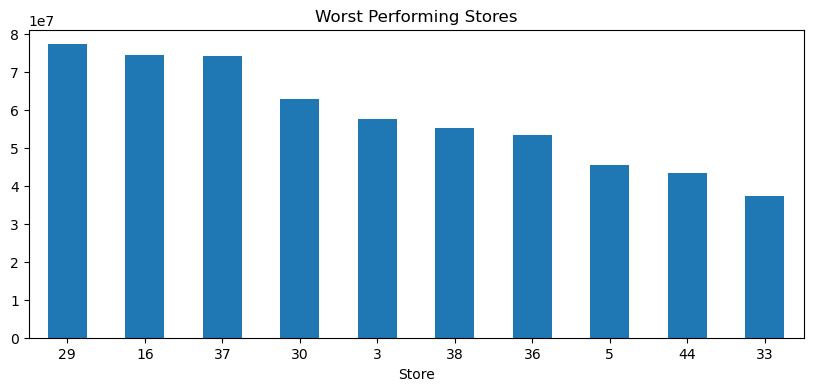

In [156]:
print(top_stores.tail(10))
top_stores.tail(10).plot(kind='bar', figsize=(10,4))
plt.title("Worst Performing Stores")
plt.xticks(rotation=0)
plt.show()

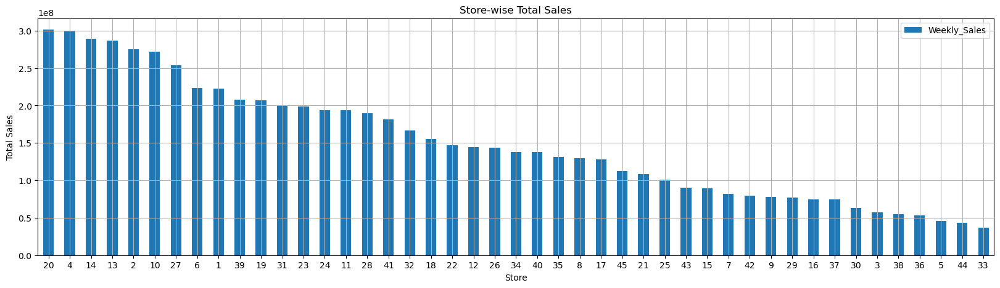

In [157]:
stores.plot(kind='bar',figsize=(20,5),grid= True)
plt.title("Store-wise Total Sales")
plt.ylabel("Total Sales")
plt.xticks(rotation=0)
plt.show()

**`Insight from Analysis`**:
* Difference betweeen top and worst is too far `approx 5 to 6 time difference` in them
* Top store include `20,4,14,13,2,10,27,6,1,39`
* Worst store includes `29,16,37,30,3,38,36,5,44,33`
* `Best Store : 20` and `Worst Store : 33`

In [158]:
# difference betweeen best and worst
Difference = top_stores.max() - top_stores.min()
print(f'Difference between best and worst is {Difference}')

Difference between best and worst is 264237570.49999997


## **Prepration For Model Building**

In [159]:
df.head(10)

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106
5,1,2010-03-12,1439541.59,0,57.79,2.667,211.380643,8.106
6,1,2010-03-19,1472515.79,0,54.58,2.720,211.215635,8.106
7,1,2010-03-26,1404429.92,0,51.45,2.732,211.018042,8.106
8,1,2010-04-02,1594968.28,0,62.27,2.719,210.820450,7.808
9,1,2010-04-09,1545418.53,0,65.86,2.770,210.622857,7.808


In [160]:
df1 = df.copy()
df1.info()

<class 'pandas.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Store         6435 non-null   int64         
 1   Date          6435 non-null   datetime64[us]
 2   Weekly_Sales  6435 non-null   float64       
 3   Holiday_Flag  6435 non-null   int64         
 4   Temperature   6435 non-null   float64       
 5   Fuel_Price    6435 non-null   float64       
 6   CPI           6435 non-null   float64       
 7   Unemployment  6435 non-null   float64       
dtypes: datetime64[us](1), float64(5), int64(2)
memory usage: 402.3 KB


In [161]:
df1=df1.iloc[:,0:3]
df1.set_index(['Date'],inplace=True)
df1

,Store,Weekly_Sales
Date,,
2010-02-05,1,1643690.90
2010-02-12,1,1641957.44
2010-02-19,1,1611968.17
2010-02-26,1,1409727.59
2010-03-05,1,1554806.68
...,...,...
2012-09-28,45,713173.95
2012-10-05,45,733455.07
2012-10-12,45,734464.36


In [162]:
weekly_s = df.groupby(['Date'])[['Weekly_Sales']].sum().reset_index().set_index(['Date'])
weekly_s

,Weekly_Sales
Date,
2010-02-05,49750740.50
2010-02-12,48336677.63
2010-02-19,48276993.78
2010-02-26,43968571.13
2010-03-05,46871470.30
...,...
2012-09-28,43734899.40
2012-10-05,47566639.31
2012-10-12,46128514.25


In [163]:
df.set_index('Date', inplace=True)
df

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
Date,,,,,,,
2010-02-05,1,1643690.90,0,42.31,2.572,211.096358,8.106
2010-02-12,1,1641957.44,1,38.51,2.548,211.242170,8.106
2010-02-19,1,1611968.17,0,39.93,2.514,211.289143,8.106
2010-02-26,1,1409727.59,0,46.63,2.561,211.319643,8.106
2010-03-05,1,1554806.68,0,46.50,2.625,211.350143,8.106
...,...,...,...,...,...,...,...
2012-09-28,45,713173.95,0,64.88,3.997,192.013558,8.684
2012-10-05,45,733455.07,0,64.89,3.985,192.170412,8.667
2012-10-12,45,734464.36,0,54.47,4.000,192.327265,8.667


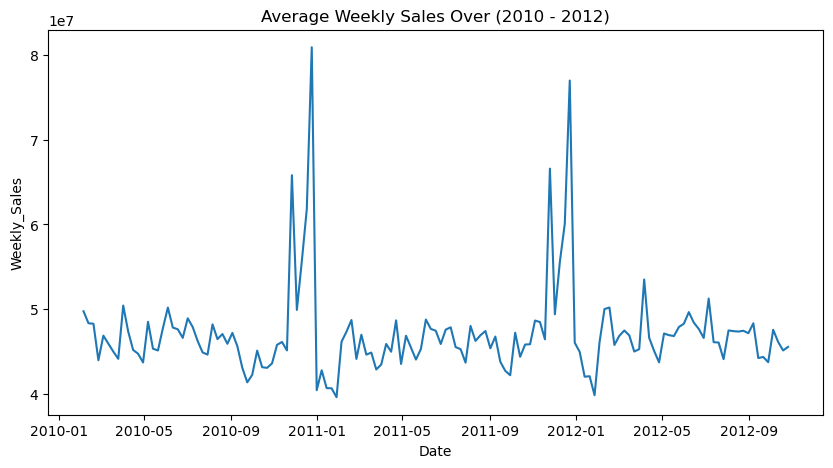

In [164]:
plt.figure(figsize=(10,5))
plt.title('Average Weekly Sales Over (2010 - 2012)')
sns.lineplot(data=weekly_s,x=weekly_s.index,y='Weekly_Sales')
plt.show()

**`To identify the patterns by ploting every store weekly sales`**

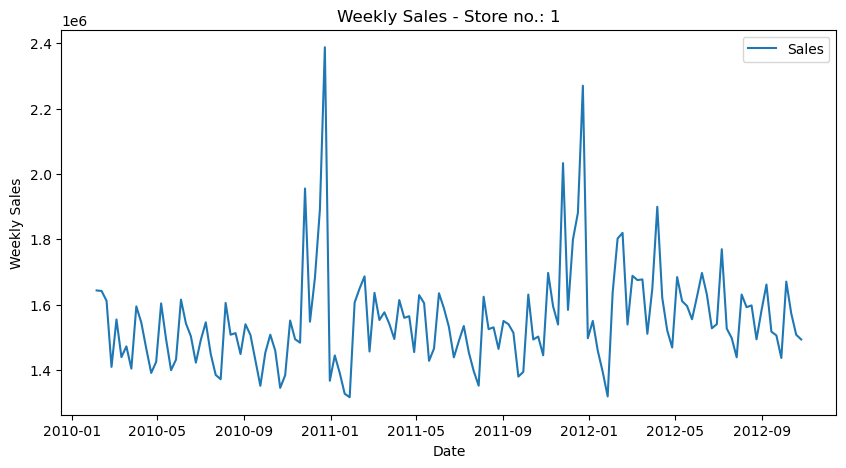

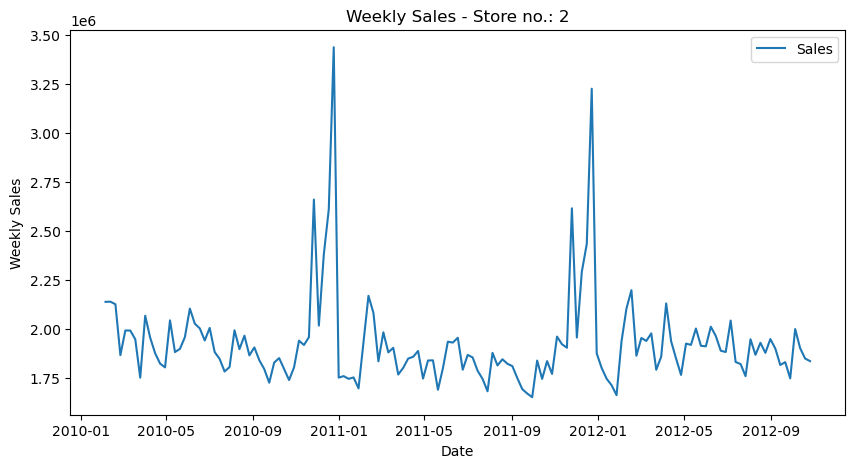

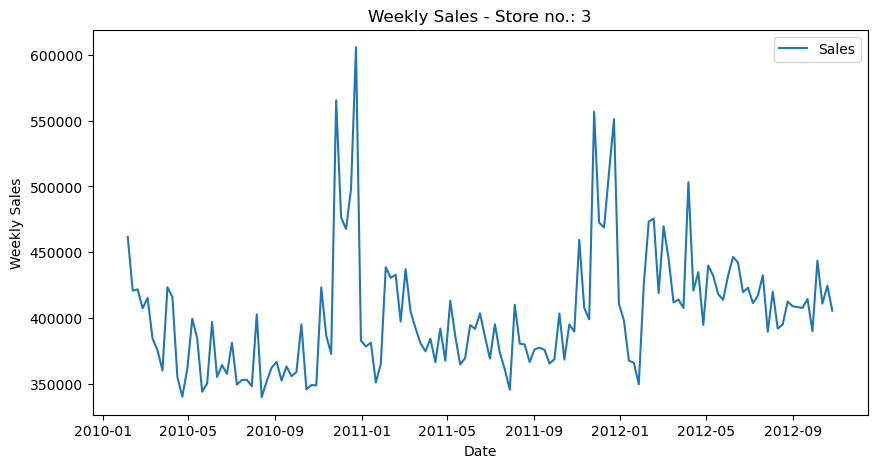

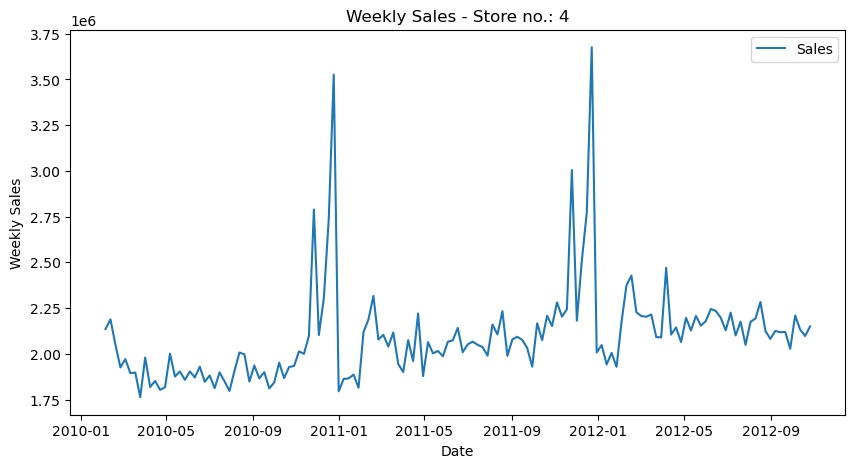

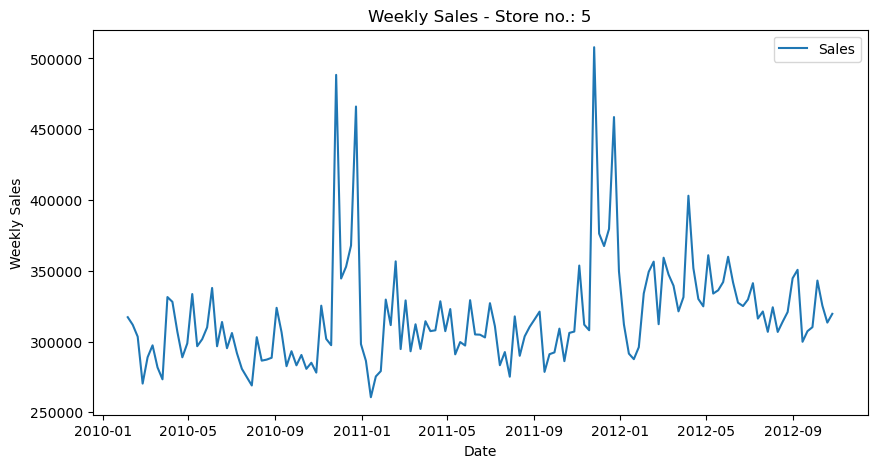

...

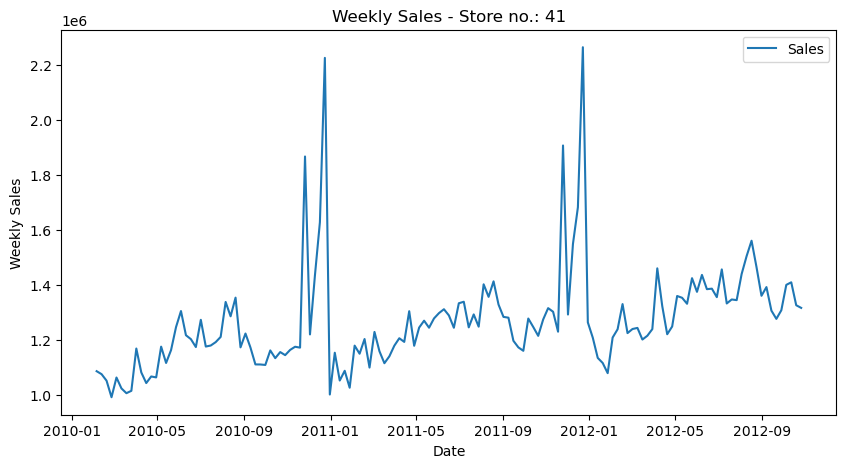

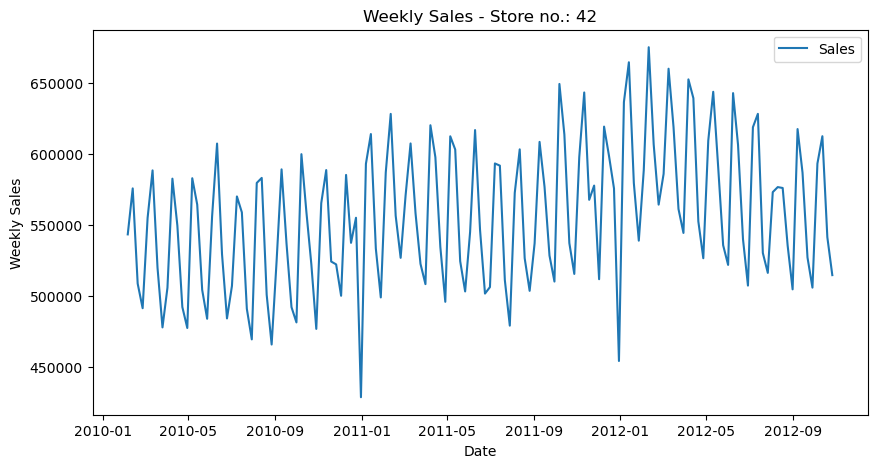

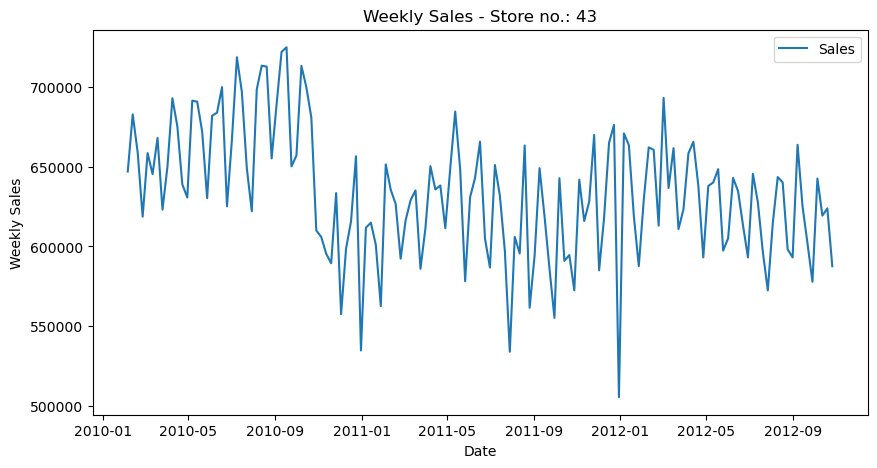

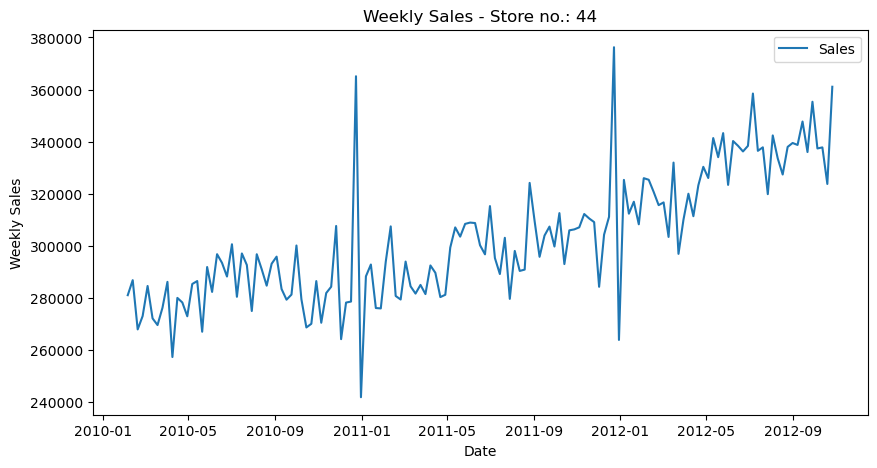

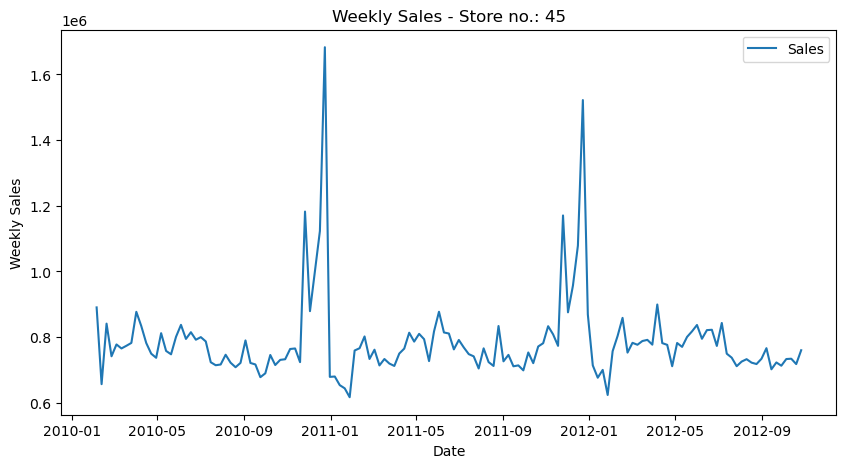

In [165]:
for x in df1['Store'].unique():
    store_data = df1[df1['Store']== x]
    plt.figure(figsize= (10,5))
    plt.plot(store_data.index,store_data['Weekly_Sales'],label='Sales')
    plt.title(f"Weekly Sales - Store no.: {x}")
    plt.xlabel('Date')
    plt.ylabel('Weekly Sales')
    plt.legend()
    plt.show()

**`Insight from Analysis`** 

* Some of the store data are not in non stationary
* To conform check by using `ADF Test`

`If ADF Test shows p_value is <0.05 data is stationary and P_value is > 0.05 data is non-stationary`

* Null hypothesis(H1)--> Data is stationary
* Alternative hypothesis(H0)--> data is non stationary

In [166]:
df1

,Store,Weekly_Sales
Date,,
2010-02-05,1,1643690.90
2010-02-12,1,1641957.44
2010-02-19,1,1611968.17
2010-02-26,1,1409727.59
2010-03-05,1,1554806.68
...,...,...
2012-09-28,45,713173.95
2012-10-05,45,733455.07
2012-10-12,45,734464.36


In [249]:
nsd = []
def adfuller_test(df1):
    for store in df1['Store'].unique():
        store_data = df1[df1['Store'] ==store]
        result = adfuller(store_data['Weekly_Sales'].dropna())
        p_value = result[1]
        print(f""" Store: {store}
        P-value : {p_value}""")
        if p_value<0.05:
            print("Reject Null Hypothesis & Data is Stationary")
        else:
            print("Fail to Reject Null Hypothesis & Data is Non-Stationary")
            nsd.append(store)

In [250]:
adfuller_test(df1)

 Store: 1
        P-value : 1.387778833075967e-05
Reject Null Hypothesis & Data is Stationary
 Store: 2
        P-value : 0.00399020708906629
Reject Null Hypothesis & Data is Stationary
 Store: 3
        P-value : 0.0384092617983122
Reject Null Hypothesis & Data is Stationary
 Store: 4
        P-value : 0.047798662236698174
Reject Null Hypothesis & Data is Stationary
 Store: 5
        P-value : 0.0004251705614192395
Reject Null Hypothesis & Data is Stationary
 Store: 6
        P-value : 2.1594858682169703e-06
Reject Null Hypothesis & Data is Stationary
 Store: 7
        P-value : 0.00021700718907117402
Reject Null Hypothesis & Data is Stationary
 Store: 8
        P-value : 1.002746442900516e-06
Reject Null Hypothesis & Data is Stationary
 Store: 9
        P-value : 2.134309368938902e-05
Reject Null Hypothesis & Data is Stationary
 Store: 10
        P-value : 8.763067535583776e-06
Reject Null Hypothesis & Data is Stationary
 Store: 11
        P-value : 0.0033168367374902526
Reject Null 

In [251]:
print(nsd)
print("There are 7 stores which are non stationary")

[np.int64(14), np.int64(30), np.int64(36), np.int64(38), np.int64(42), np.int64(43), np.int64(44)]
There are 7 stores which are non stationary


In [267]:
def make_stationary(df1):
    stationary_data = {}
    for store in df1['Store'].unique():
        store_data = df1[df1['Store'] ==store].copy()
        result = adfuller(store_data['Weekly_Sales'])
        p_value = result[1]
        print(f""" Store: {store}
        P-value : {p_value}""")
        if p_value<0.05:
            print("Reject Null Hypothesis & Data is Stationary")
            stationary_data[store] = store_data['Weekly_Sales']

        else:
            print("Non-Stationary → Applying differencing")
            store_data['diff_sales'] = store_data['Weekly_Sales'].diff()
            store_data = store_data.dropna()
            result2 = adfuller(store_data['diff_sales'])
            p_value2 = result2[1]
            print("After Differencing P-value:", p_value2)
            if p_value2 < 0.05:
                print("Now Stationary\n")
            else:
                print("Still Non-Stationary (may need second differencing)\n")
            stationary_data[store] = store_data['diff_sales']
            
    return stationary_data

In [268]:
stationary_data  = make_stationary(df1)

 Store: 1
        P-value : 1.387778833075967e-05
Reject Null Hypothesis & Data is Stationary
 Store: 2
        P-value : 0.00399020708906629
Reject Null Hypothesis & Data is Stationary
 Store: 3
        P-value : 0.0384092617983122
Reject Null Hypothesis & Data is Stationary
 Store: 4
        P-value : 0.047798662236698174
Reject Null Hypothesis & Data is Stationary
 Store: 5
        P-value : 0.0004251705614192395
Reject Null Hypothesis & Data is Stationary
 Store: 6
        P-value : 2.1594858682169703e-06
Reject Null Hypothesis & Data is Stationary
 Store: 7
        P-value : 0.00021700718907117402
Reject Null Hypothesis & Data is Stationary
 Store: 8
        P-value : 1.002746442900516e-06
Reject Null Hypothesis & Data is Stationary
 Store: 9
        P-value : 2.134309368938902e-05
Reject Null Hypothesis & Data is Stationary
 Store: 10
        P-value : 8.763067535583776e-06
Reject Null Hypothesis & Data is Stationary
 Store: 11
        P-value : 0.0033168367374902526
Reject Null 

In [269]:
stationary_data

{np.int64(1): Date
 2010-02-05    1643690.90
 2010-02-12    1641957.44
 2010-02-19    1611968.17
 2010-02-26    1409727.59
 2010-03-05    1554806.68
                  ...    
 2012-09-28    1437059.26
 2012-10-05    1670785.97
 2012-10-12    1573072.81
 2012-10-19    1508068.77
 2012-10-26    1493659.74
 Name: Weekly_Sales, Length: 143, dtype: float64,
 np.int64(2): Date
 2010-02-05    2136989.46
 2010-02-12    2137809.50
 2010-02-19    2124451.54
 2010-02-26    1865097.27
 2010-03-05    1991013.13
                  ...    
 2012-09-28    1746470.56
 2012-10-05    1998321.04
 2012-10-12    1900745.13
 2012-10-19    1847990.41
 2012-10-26    1834458.35
 Name: Weekly_Sales, Length: 143, dtype: float64,
 np.int64(3): Date
 2010-02-05    461622.22
 2010-02-12    420728.96
 2010-02-19    421642.19
 2010-02-26    407204.86
 2010-03-05    415202.04
                 ...    
 2012-09-28    389813.02
 2012-10-05    443557.65
 2012-10-12    410804.39
 2012-10-19    424513.08
 2012-10-26    405432

In [270]:
stationary_df = pd.concat(stationary_data) # pd.concat make row as "Date" , col's as "Store" & values as 'Weekly_sales'

stationary_df = stationary_df.reset_index()

In [271]:
stationary_df.columns = ['Store', 'Date', 'Weekly_Sales']
stationary_df.index = stationary_df['Date']
stationary_df.drop('Date',axis = 1, inplace = True)
stationary_df

,Store,Weekly_Sales
Date,,
2010-02-05,1,1643690.90
2010-02-12,1,1641957.44
2010-02-19,1,1611968.17
2010-02-26,1,1409727.59
2010-03-05,1,1554806.68
...,...,...
2012-09-28,45,713173.95
2012-10-05,45,733455.07
2012-10-12,45,734464.36


## **Model Building**

Store No. : 1
Train size:  131
Train size:  12


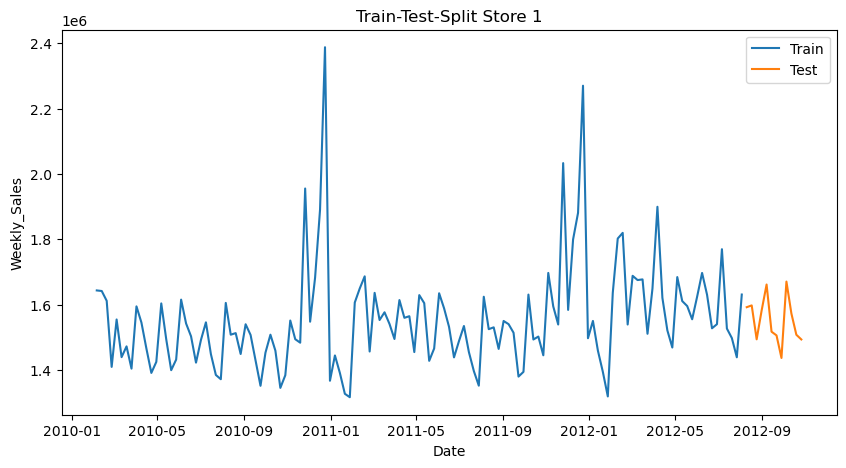

Store No. : 2
Train size:  131
Train size:  12


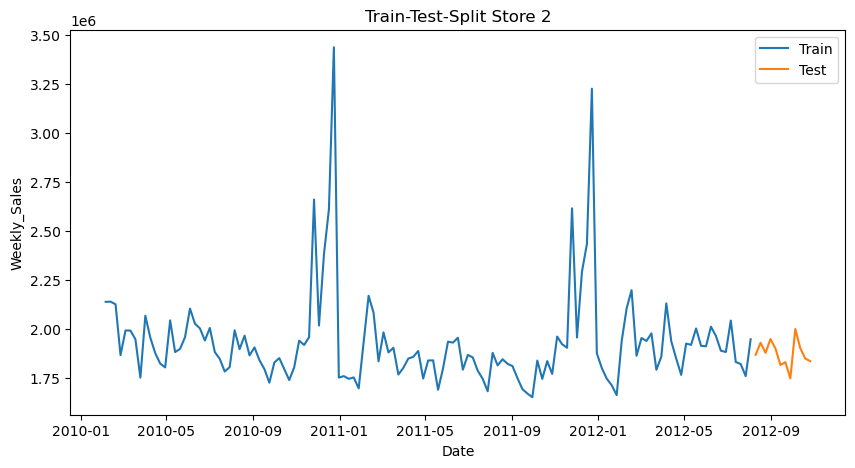

Store No. : 3
Train size:  131
Train size:  12


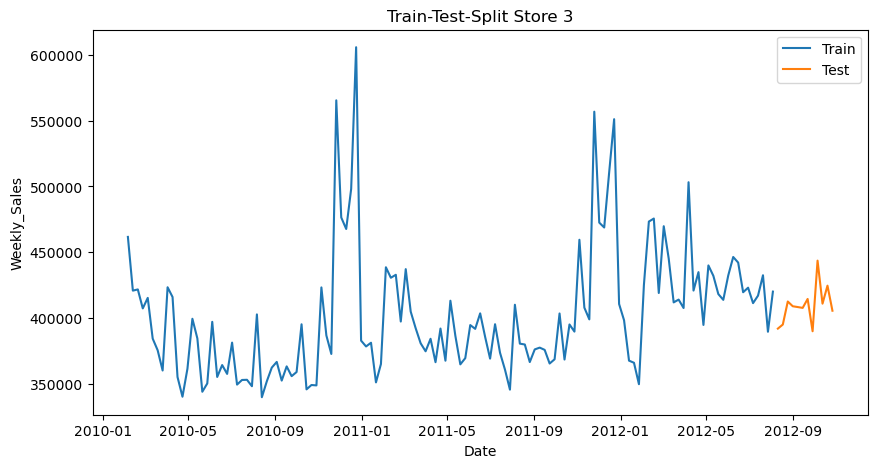

Store No. : 4
Train size:  131
Train size:  12


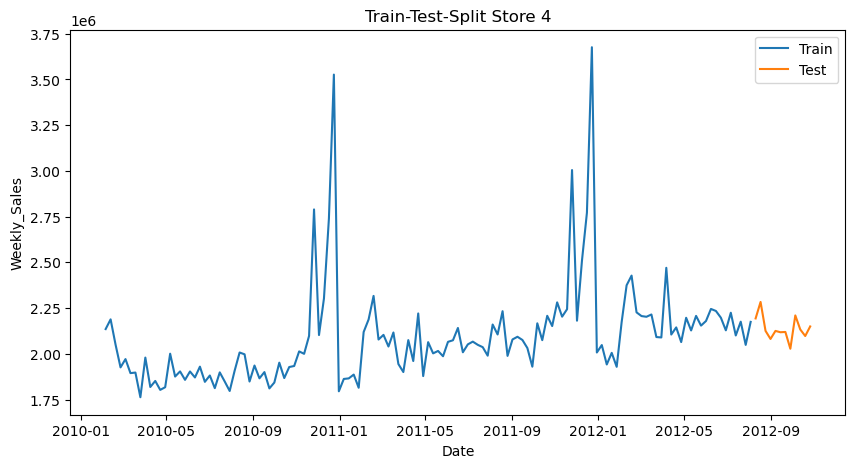

Store No. : 5
Train size:  131
Train size:  12


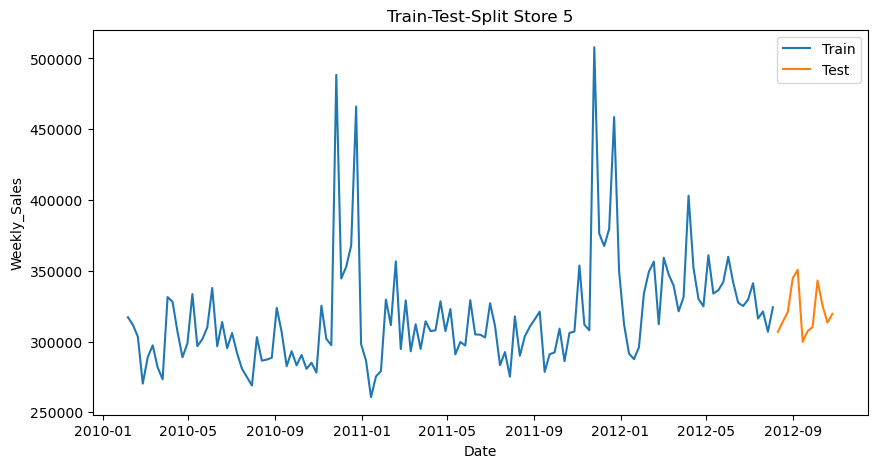

Store No. : 6
Train size:  131
Train size:  12


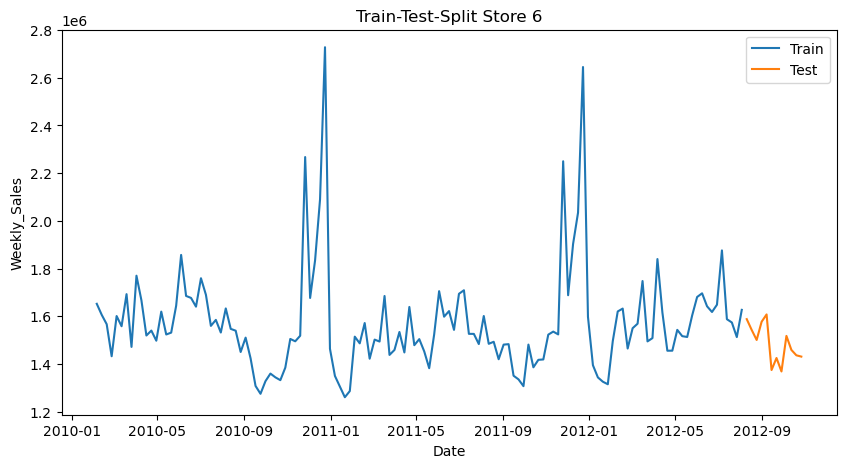

Store No. : 7
Train size:  131
Train size:  12


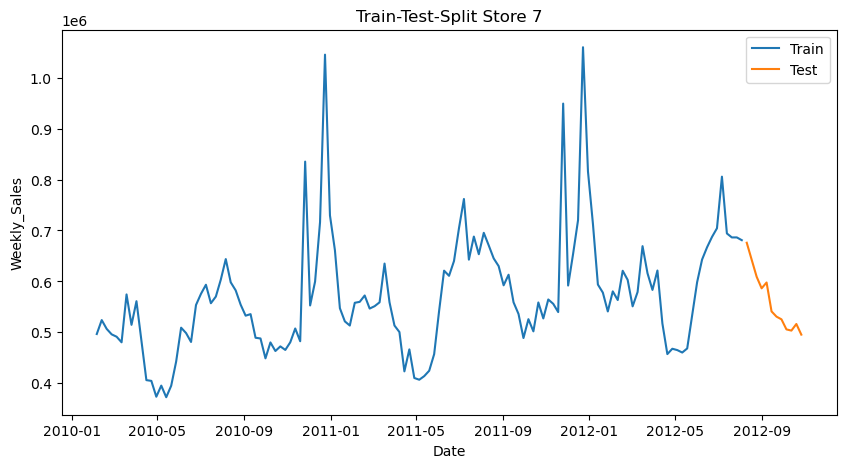

Store No. : 8
Train size:  131
Train size:  12


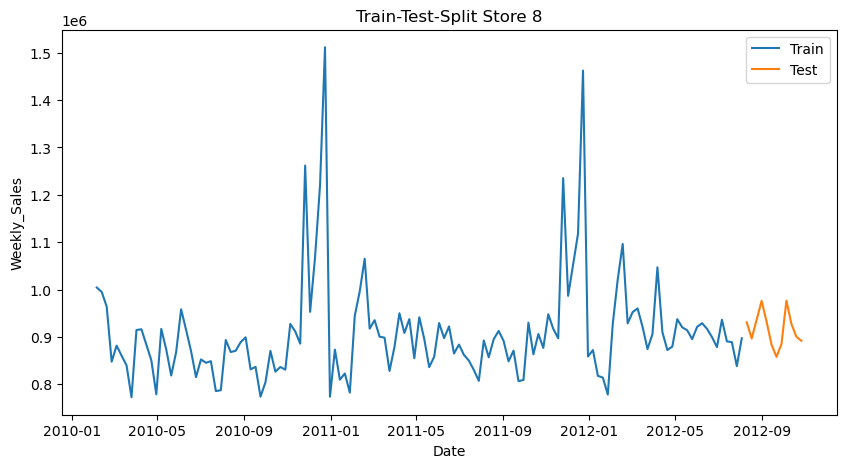

Store No. : 9
Train size:  131
Train size:  12


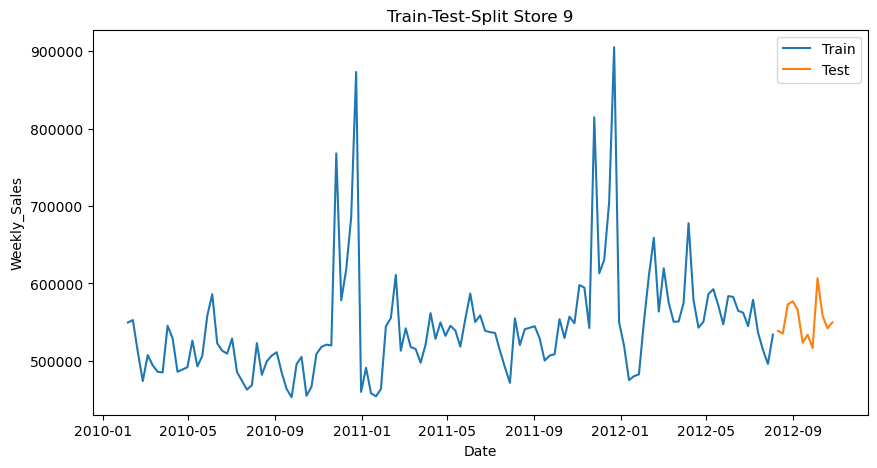

Store No. : 10
Train size:  131
Train size:  12


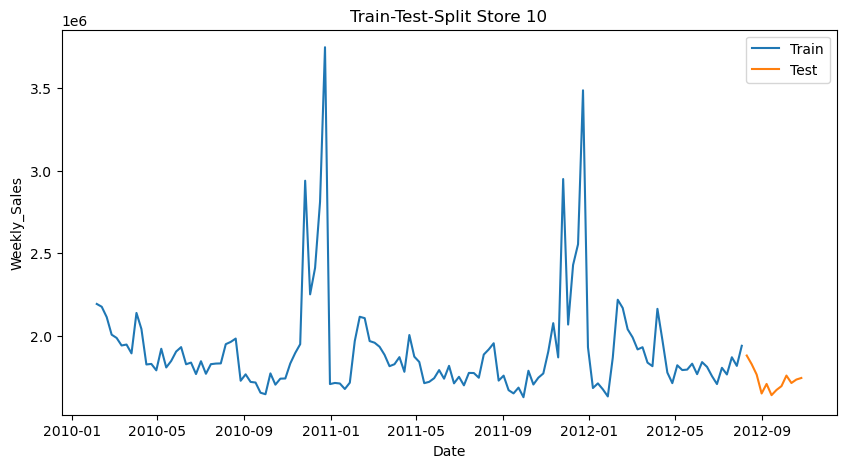

Store No. : 11
Train size:  131
Train size:  12


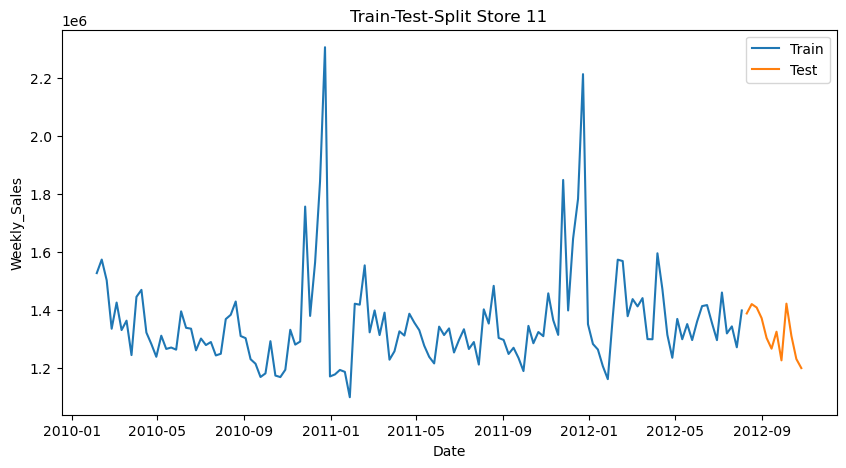

Store No. : 12
Train size:  131
Train size:  12


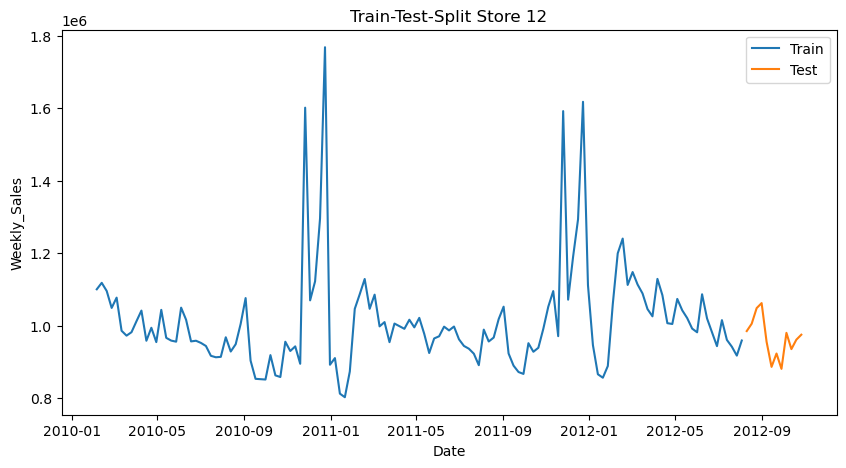

Store No. : 13
Train size:  131
Train size:  12


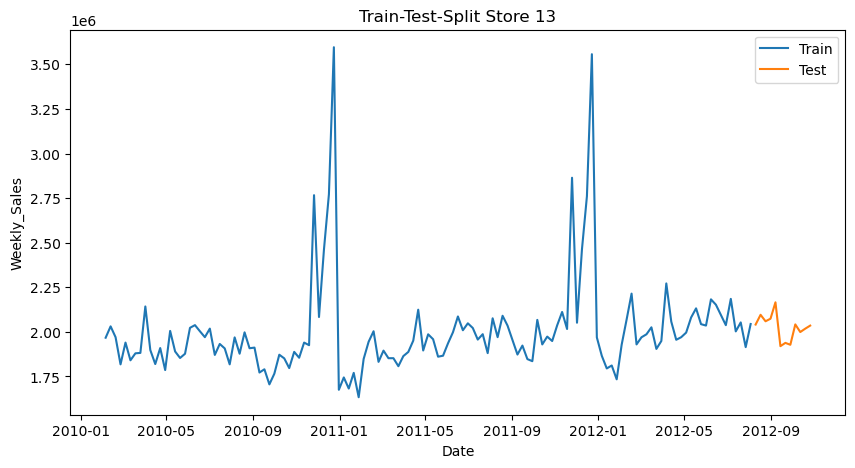

Store No. : 14
Train size:  130
Train size:  12


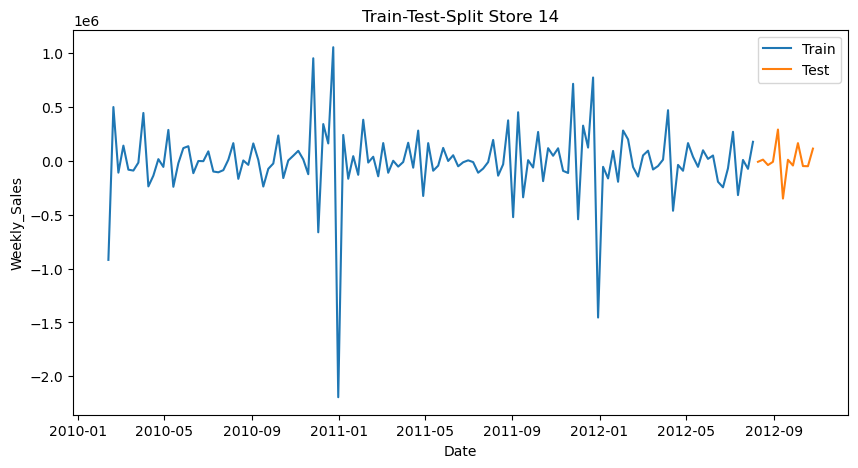

Store No. : 15
Train size:  131
Train size:  12


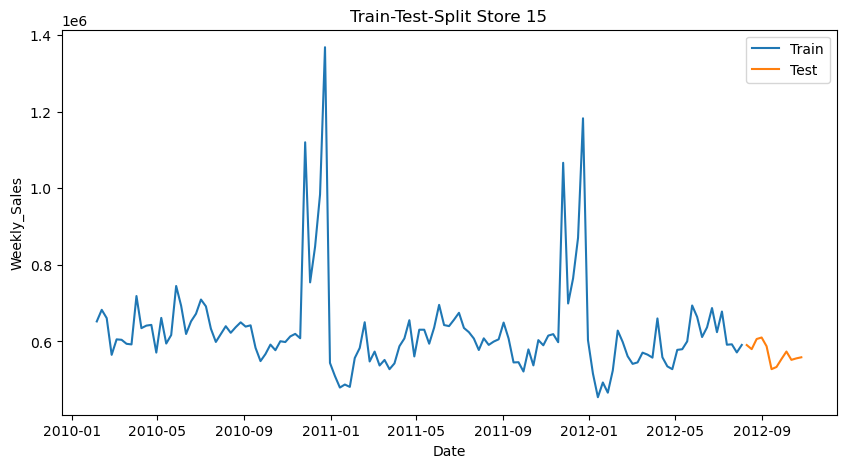

Store No. : 16
Train size:  131
Train size:  12


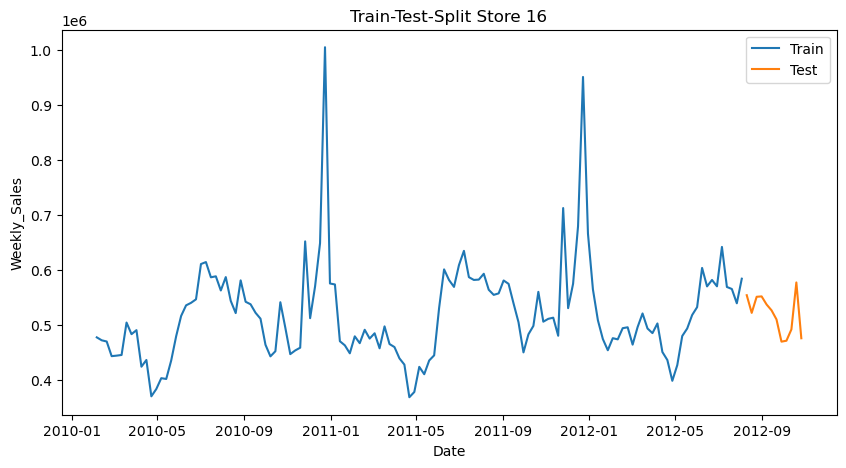

Store No. : 17
Train size:  131
Train size:  12


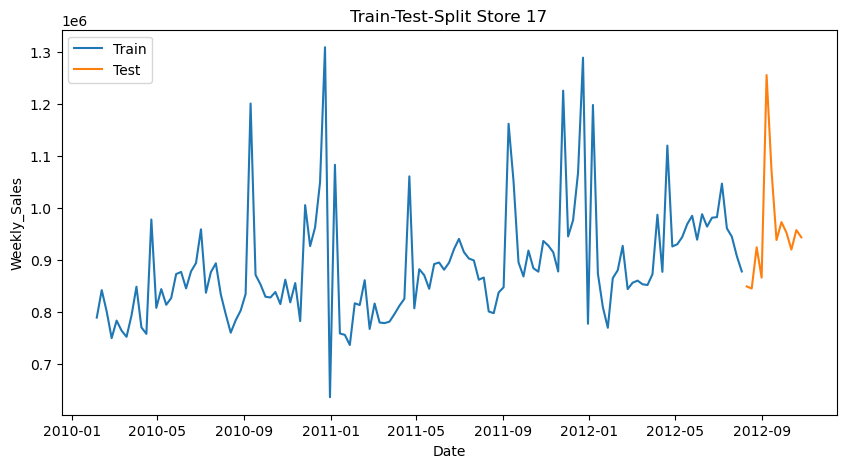

Store No. : 18
Train size:  131
Train size:  12


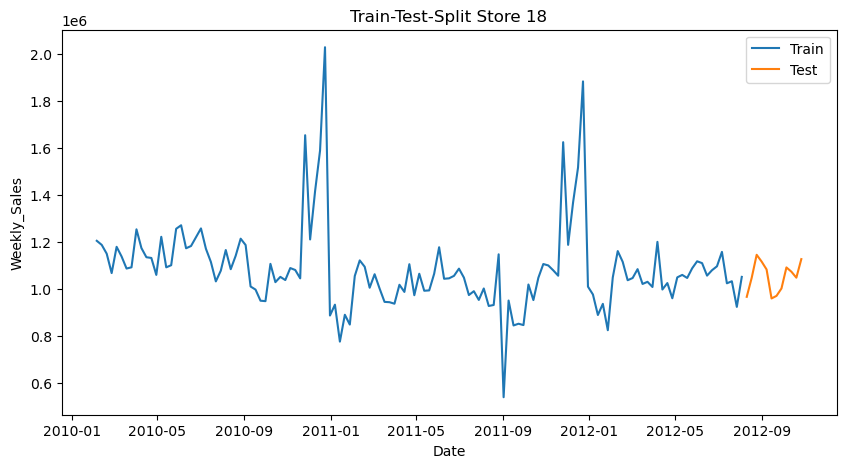

Store No. : 19
Train size:  131
Train size:  12


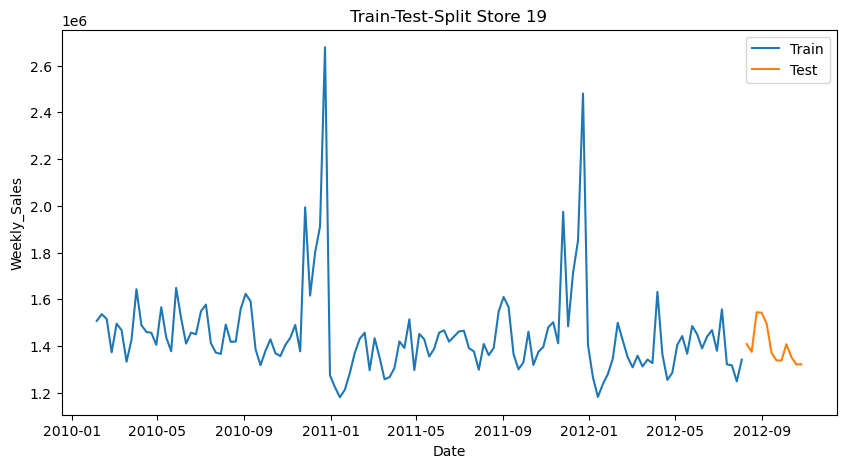

Store No. : 20
Train size:  131
Train size:  12


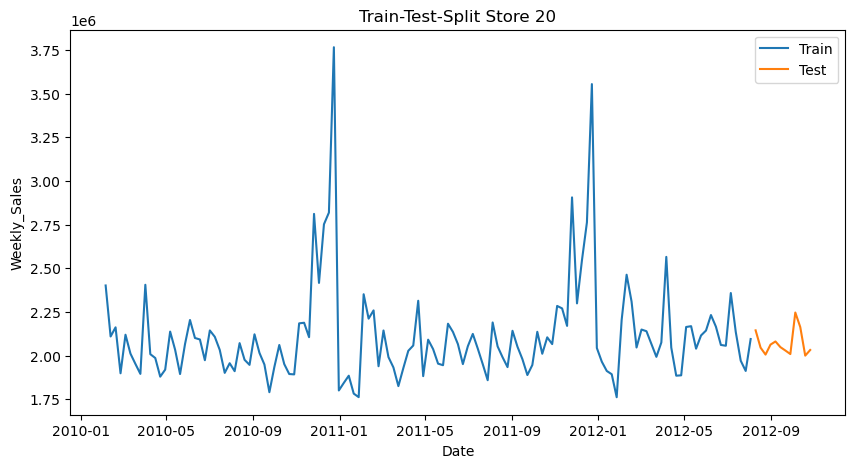

Store No. : 21
Train size:  131
Train size:  12


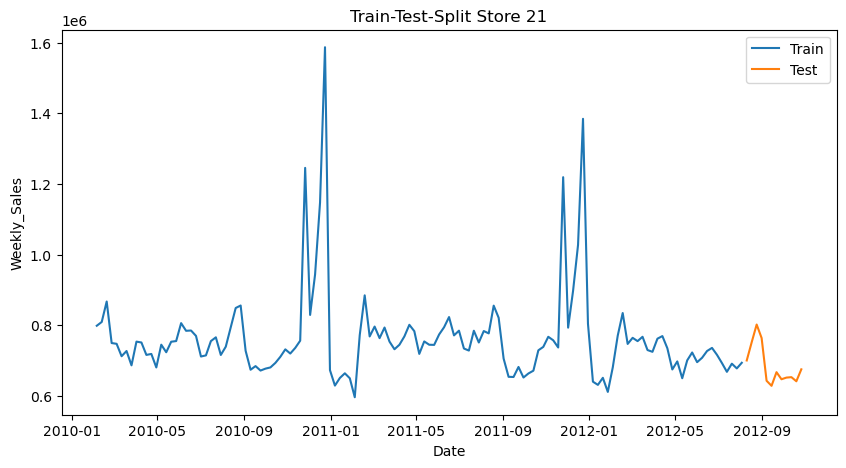

Store No. : 22
Train size:  131
Train size:  12


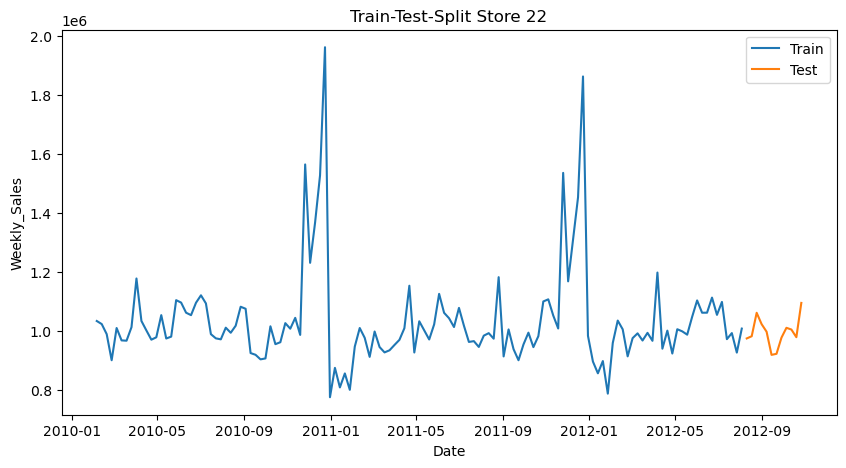

Store No. : 23
Train size:  131
Train size:  12


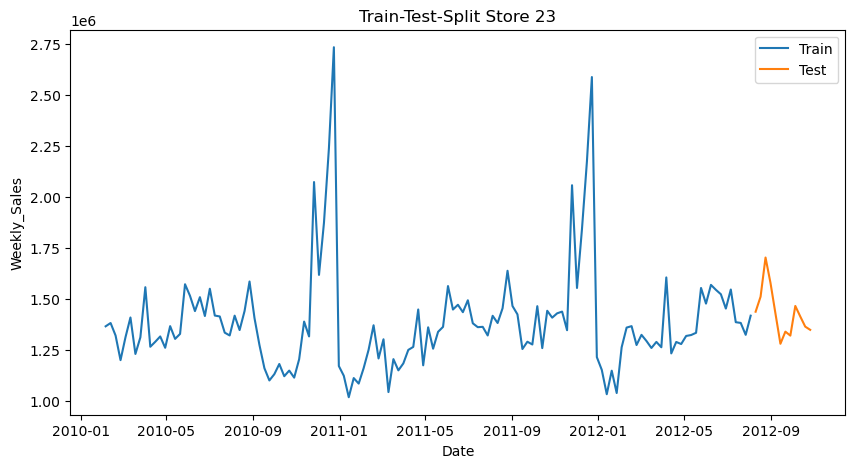

Store No. : 24
Train size:  131
Train size:  12


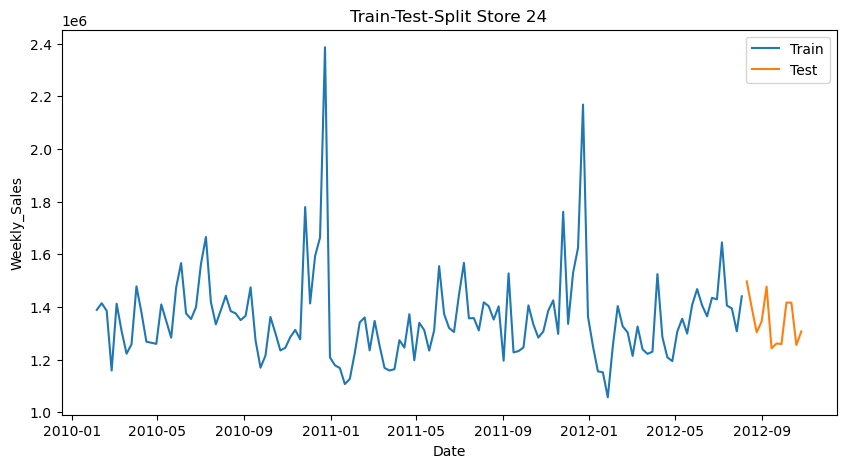

Store No. : 25
Train size:  131
Train size:  12


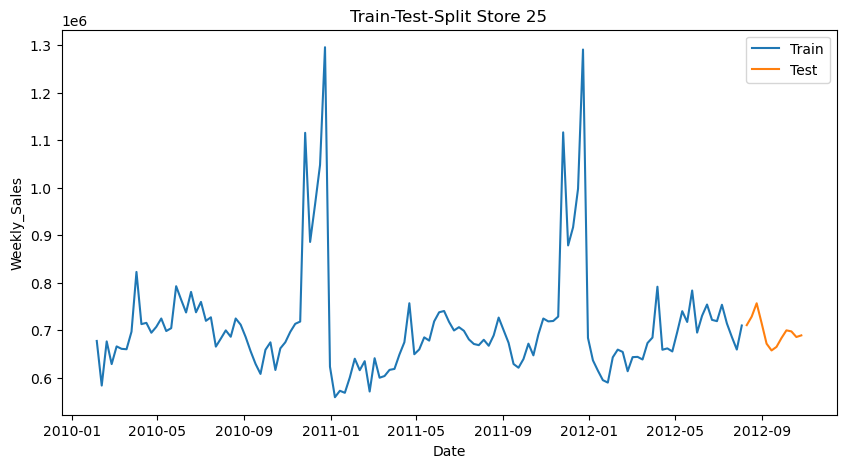

Store No. : 26
Train size:  131
Train size:  12


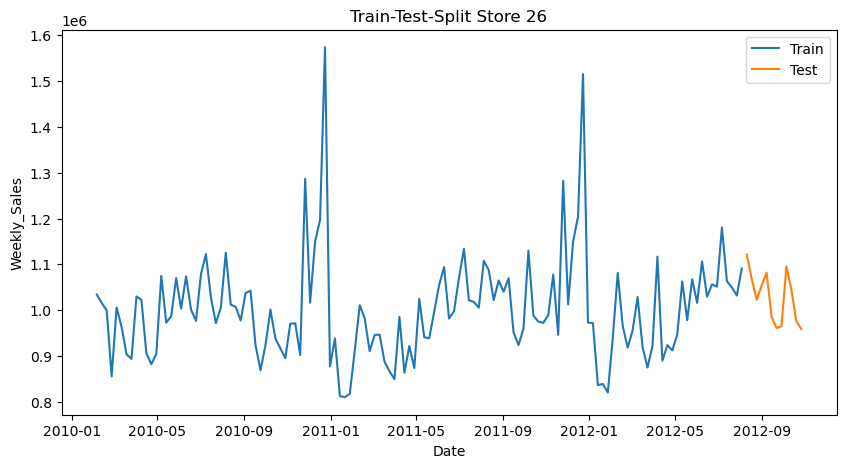

Store No. : 27
Train size:  131
Train size:  12


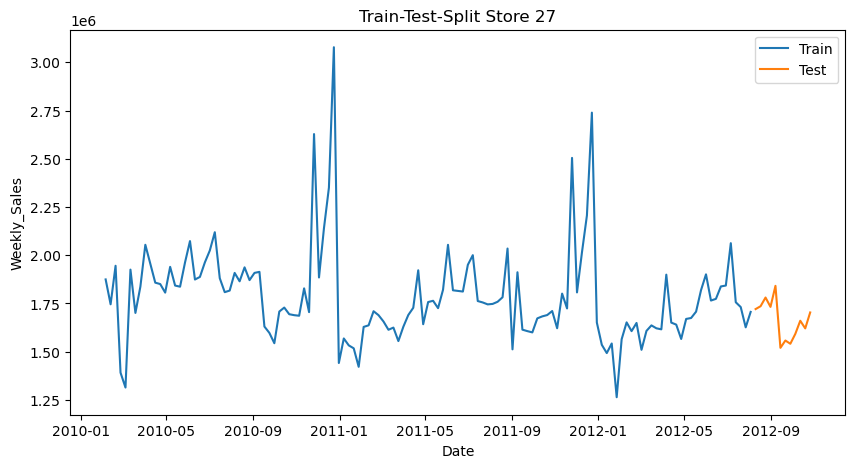

Store No. : 28
Train size:  131
Train size:  12


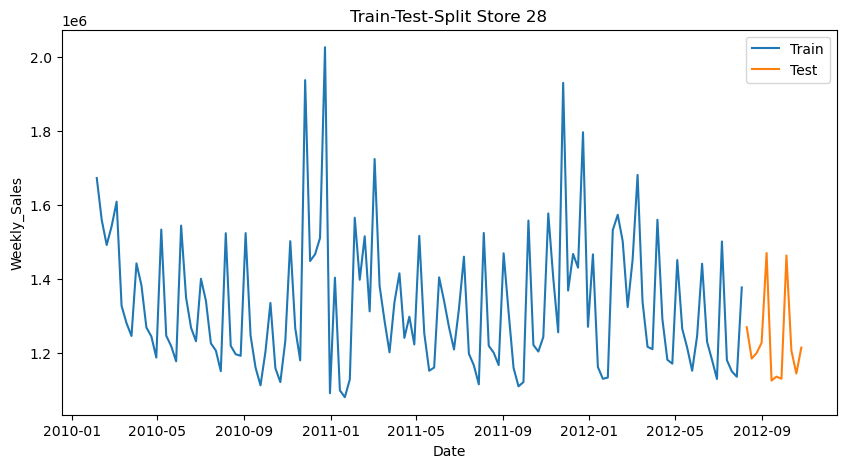

Store No. : 29
Train size:  131
Train size:  12


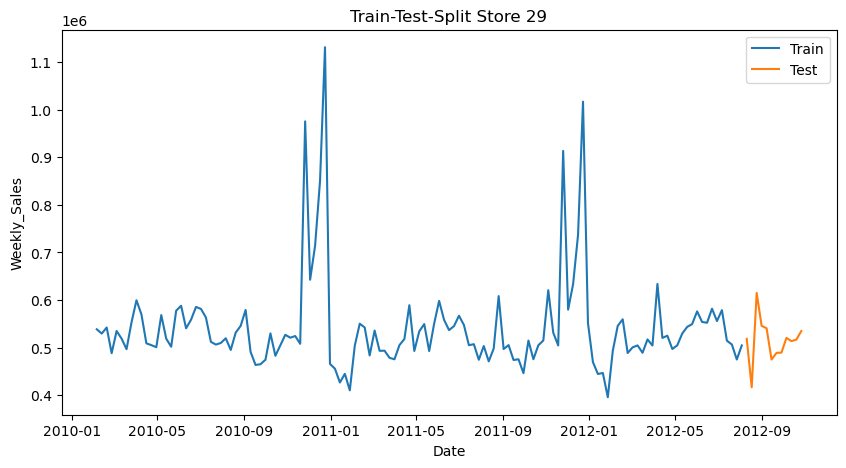

Store No. : 30
Train size:  130
Train size:  12


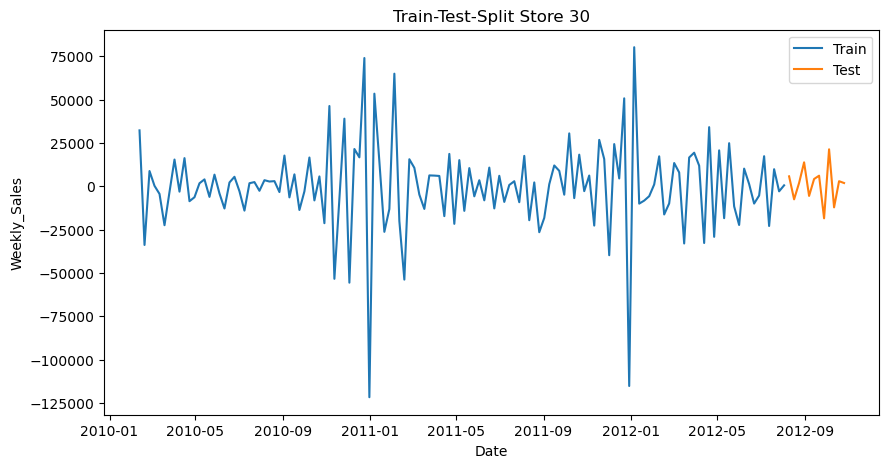

Store No. : 31
Train size:  131
Train size:  12


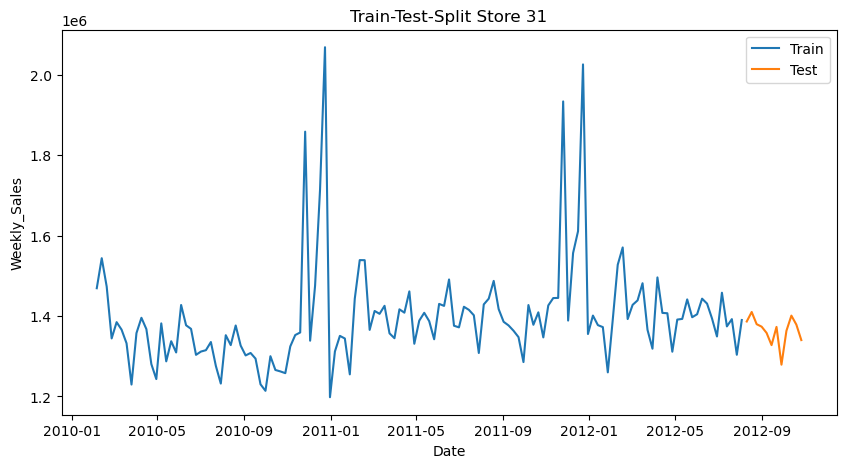

Store No. : 32
Train size:  131
Train size:  12


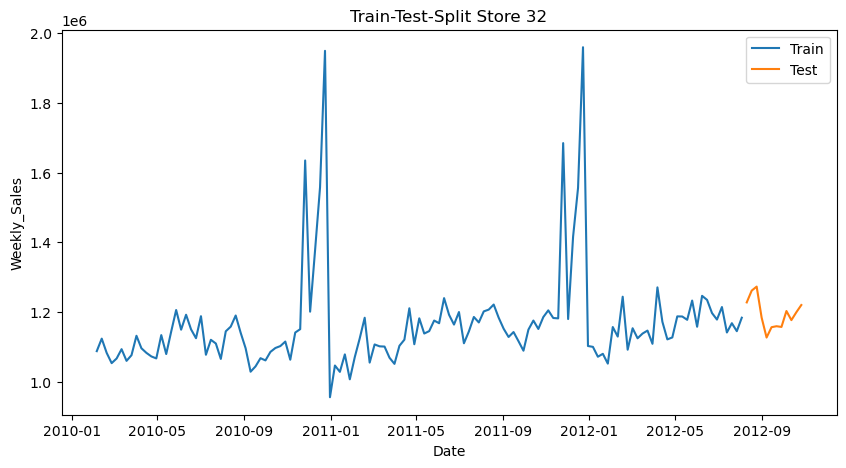

Store No. : 33
Train size:  131
Train size:  12


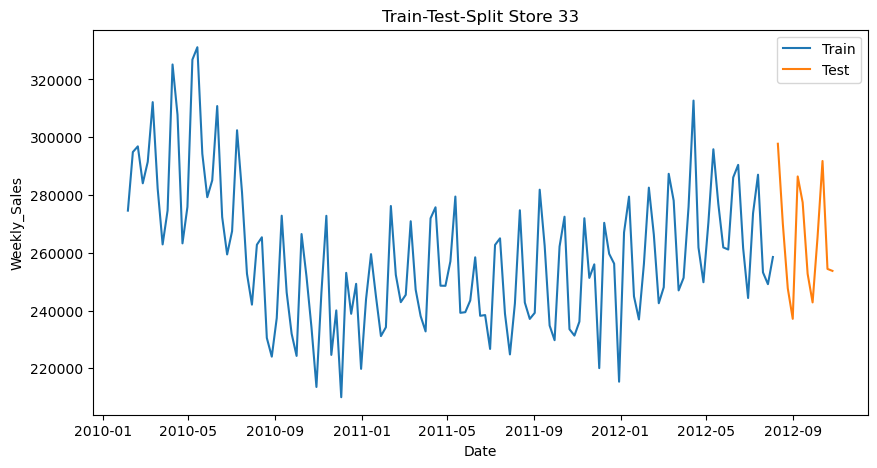

Store No. : 34
Train size:  131
Train size:  12


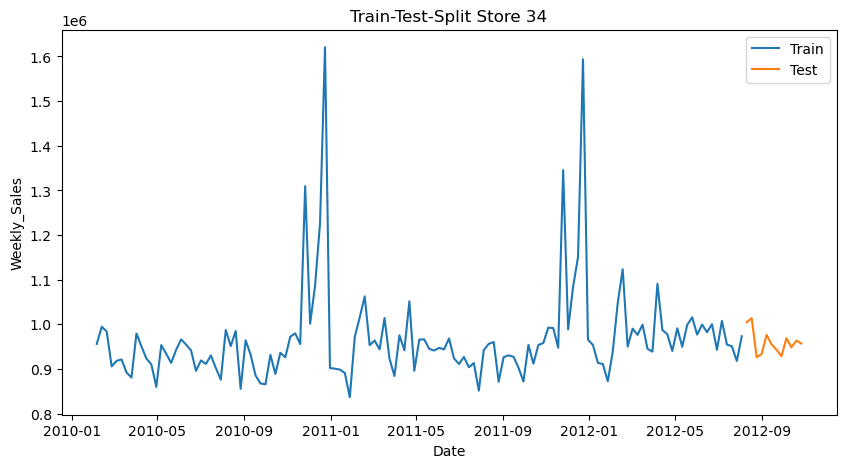

Store No. : 35
Train size:  131
Train size:  12


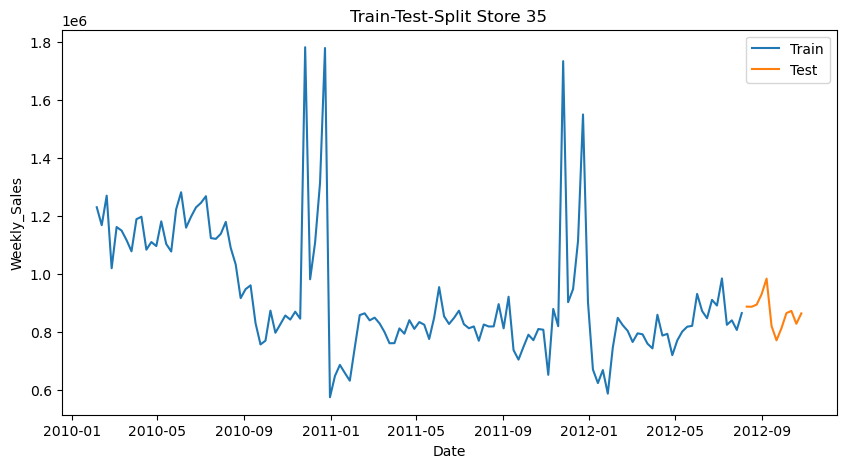

Store No. : 36
Train size:  130
Train size:  12


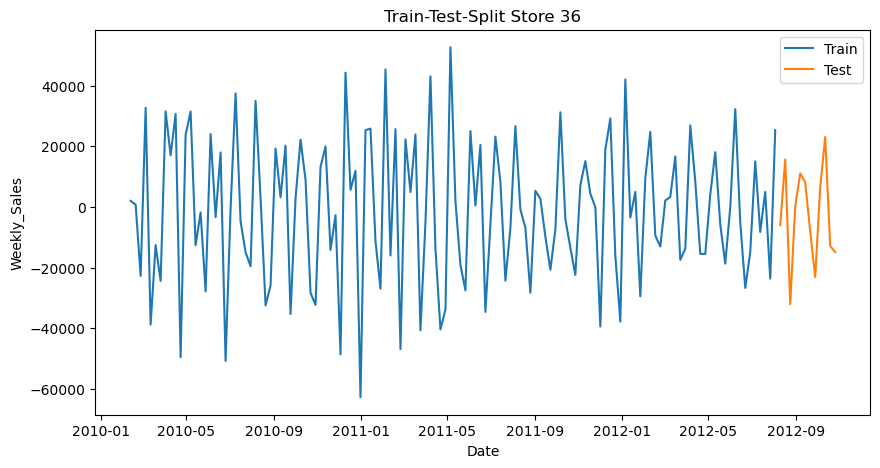

Store No. : 37
Train size:  131
Train size:  12


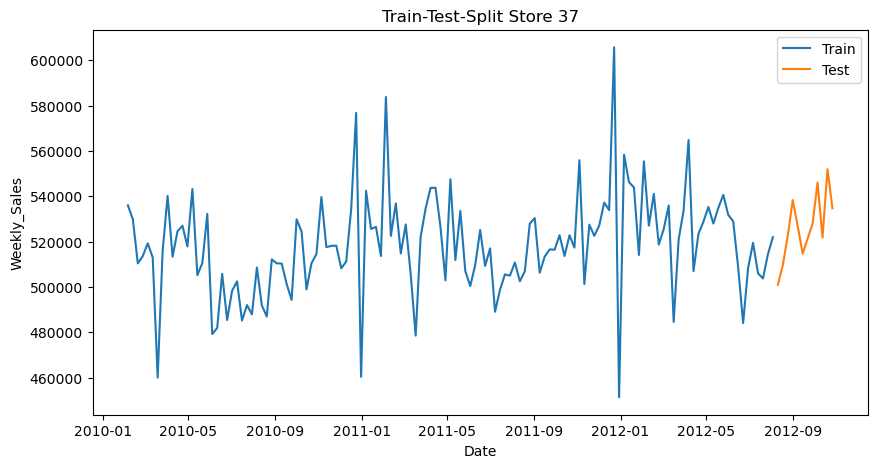

Store No. : 38
Train size:  130
Train size:  12


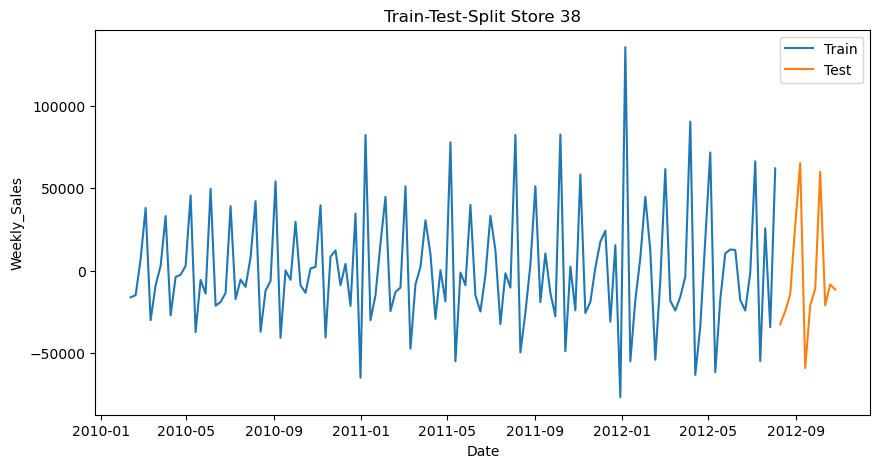

Store No. : 39
Train size:  131
Train size:  12


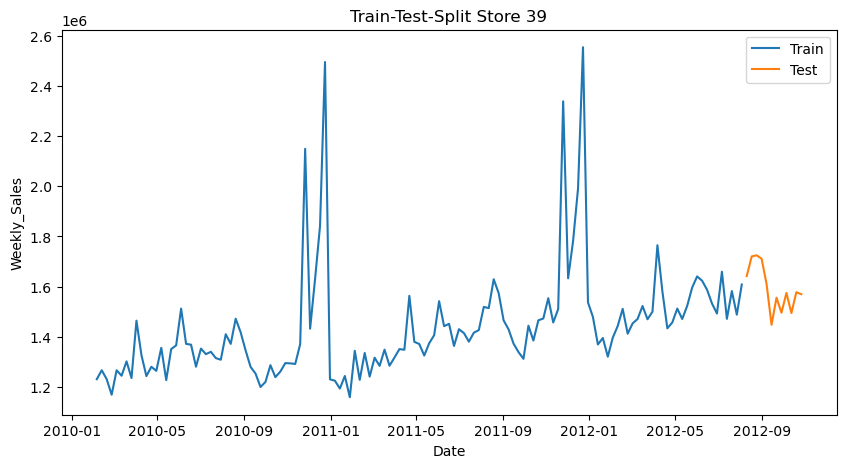

Store No. : 40
Train size:  131
Train size:  12


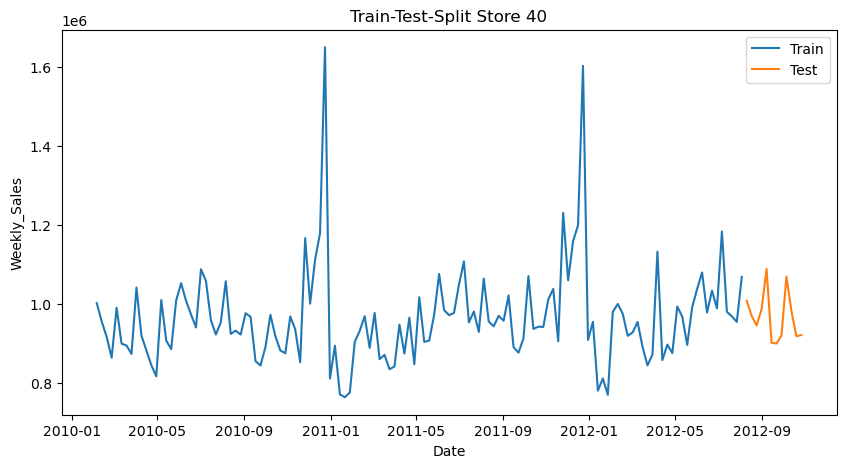

Store No. : 41
Train size:  131
Train size:  12


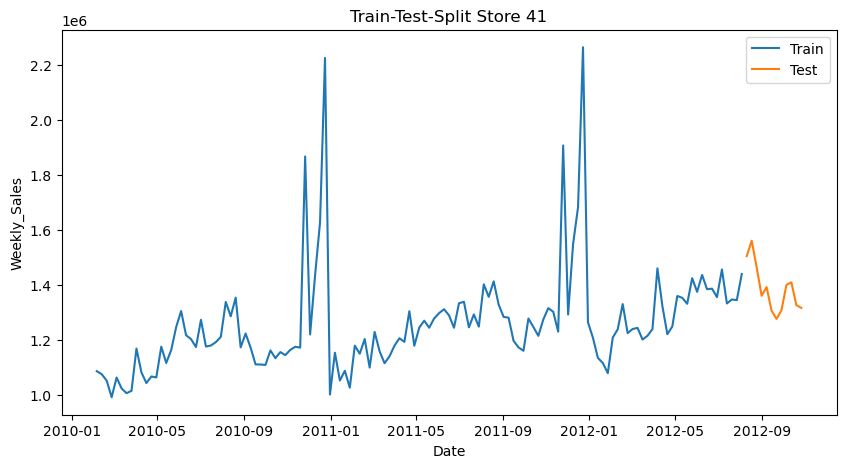

Store No. : 42
Train size:  130
Train size:  12


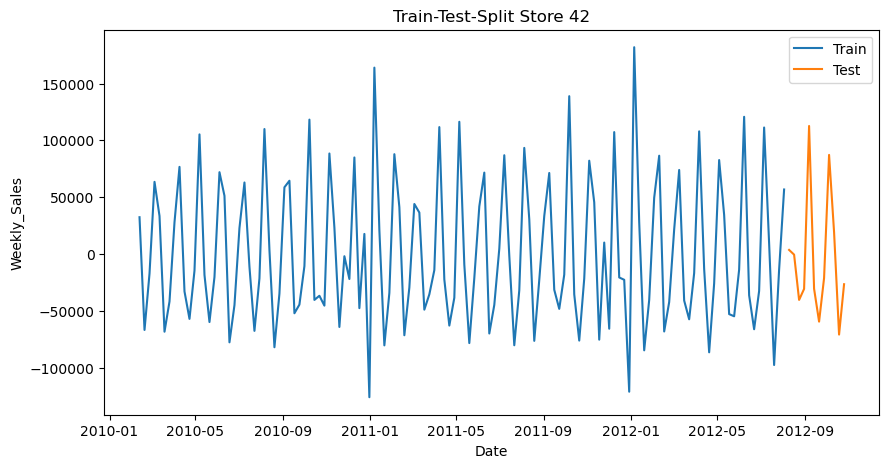

Store No. : 43
Train size:  130
Train size:  12


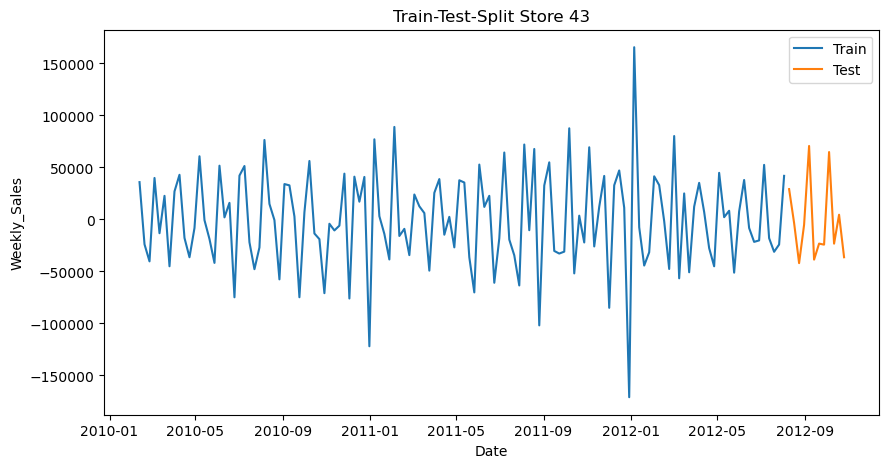

Store No. : 44
Train size:  130
Train size:  12


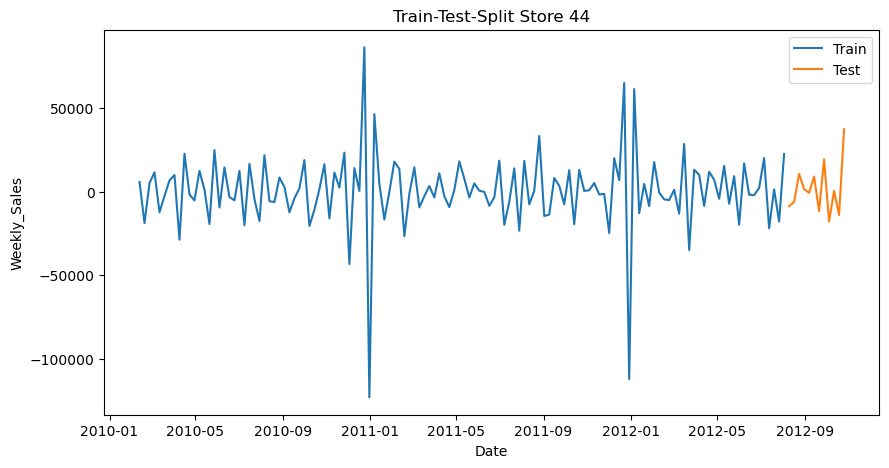

Store No. : 45
Train size:  131
Train size:  12


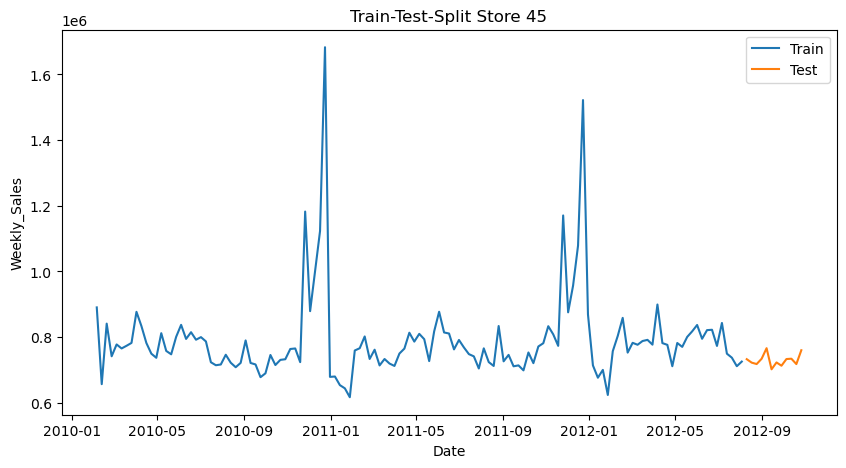

In [272]:
for store in stationary_df['Store'].unique():
    print("Store No. :" ,store)
    store_data = stationary_df[stationary_df['Store'] == store].copy()
    train = store_data.iloc[:-12]
    test = store_data.iloc[-12:]
    print("Train size: ", len(train))
    print("Train size: ", len(test))
    plt.figure(figsize = (10,5))
    plt.title('Train-Test-Split Store {}'.format(store))
    sns.lineplot(data = train,x= train.index, y = train["Weekly_Sales"],label = 'Train')
    sns.lineplot(data = test, x= test.index, y = test["Weekly_Sales"], label = 'Test')
    plt.legend()
    plt.show()

Instead of Using `ACF( Auto Correlation Function )` & `PACF( Partial Autocorrelation Function )`.

Here we are using `auto_arima` which gives best model name and best `p d q values`.

In [258]:
models = {}
for store in stationary_df['Store'].unique():
    store_data = stationary_df[stationary_df['Store'] == store]
    auto_model = auto_arima(store_data['Weekly_Sales'],seasonal = False,trace=True)
    models[store]=auto_model

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3819.024, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3850.005, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3838.724, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3831.432, Time=0.03 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3848.013, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3819.410, Time=0.19 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3821.284, Time=0.08 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=3817.475, Time=0.12 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3818.117, Time=0.12 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=3810.990, Time=0.15 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=3809.486, Time=0.14 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3810.431, Time=0.08 sec
 ARIMA(2,1,4)(0,0,0)[0] intercept   : AIC=3810.637, Time=0.22 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : 

### **`ARIMA`**

In [273]:
forcasts = {}
for store in stationary_df['Store'].unique():
    store_data = stationary_df[stationary_df['Store']==store].sort_values('Date')
    store_data = store_data.asfreq('W-FRI')
    model = ARIMA(store_data['Weekly_Sales'],order=(1,0,0))
    model_fit = model.fit()
    forcast = model_fit.forecast(steps=12) # prediction value
    forcasts[store] = forcast

In [260]:
forcast_df = pd.DataFrame(forcasts)
forcast_df

,1,2,3,4,5,6,7,8,9,10,...,36,37,38,39,40,41,42,43,44,45
2012-11-02,1.536750e+06,1.890784e+06,404147.910182,2.117810e+06,318612.228748,1.505154e+06,520296.253715,902507.938313,546485.314782,1.825273e+06,...,1873.047878,519614.708153,5528.044141,1.509096e+06,952272.158303,1.288634e+06,2373.893391,12447.362920,-22154.951705,776057.767471
2012-11-09,1.549700e+06,1.912358e+06,403468.152697,2.104433e+06,318246.061022,1.538104e+06,536887.820369,906468.388103,545071.476174,1.863968e+06,...,-2154.631924,518932.508250,-1778.137641,1.479396e+06,960848.749829,1.276812e+06,-452.394159,-5029.721167,14612.092854,782149.551171
2012-11-16,1.553592e+06,1.920621e+06,403108.506136,2.098804e+06,318103.202301,1.552829e+06,548008.911806,907915.826390,544455.693144,1.882470e+06,...,-1185.776992,518901.735620,1353.750615,1.464793e+06,963221.001514,1.271805e+06,-177.184575,1234.212540,-8124.596116,784501.797294
2012-11-23,1.554762e+06,1.923786e+06,402918.224085,2.096435e+06,318047.466601,1.559411e+06,555463.221415,908444.826302,544187.495107,1.891318e+06,...,-1418.834217,518900.347530,11.226662,1.457613e+06,963877.157055,1.269684e+06,-203.983092,-1010.833904,5935.740567,785410.080006
2012-11-30,1.555113e+06,1.924999e+06,402817.549526,2.095438e+06,318025.721564,1.562352e+06,560459.739254,908638.161597,544070.684179,1.895548e+06,...,-1362.772501,518900.284916,586.716723,1.454083e+06,964058.647112,1.268786e+06,-201.373588,-206.190405,-2759.151987,785760.799039
2012-12-07,1.555219e+06,1.925463e+06,402764.284560,2.095018e+06,318017.237834,1.563666e+06,563808.834184,908708.820467,544019.808367,1.897571e+06,...,-1376.258099,518900.282091,340.025549,1.452347e+06,964108.846553,1.268405e+06,-201.627688,-494.581393,2617.757416,785896.223658
2012-12-14,1.555251e+06,1.925641e+06,402736.103096,2.094841e+06,318013.927944,1.564254e+06,566053.684940,908734.644390,543997.649925,1.898538e+06,...,-1373.014150,518900.281964,445.772876,1.451494e+06,964122.731522,1.268244e+06,-201.602945,-391.219641,-707.315844,785948.515737
2012-12-21,1.555260e+06,1.925709e+06,402721.192827,2.094767e+06,318012.636605,1.564516e+06,567558.376513,908744.082343,543987.999040,1.899001e+06,...,-1373.794479,518900.281958,400.442932,1.451074e+06,964126.572050,1.268176e+06,-201.605355,-428.265361,1348.904813,785968.707498
2012-12-28,1.555263e+06,1.925735e+06,402713.304091,2.094736e+06,318012.132795,1.564633e+06,568566.949899,908747.531661,543983.795696,1.899222e+06,...,-1373.606771,518900.281958,419.874192,1.450868e+06,964127.634325,1.268147e+06,-201.605120,-414.987864,77.340833,785976.504228
2013-01-04,1.555264e+06,1.925745e+06,402709.130314,2.094723e+06,318011.936236,1.564686e+06,569242.982312,908748.792295,543981.964972,1.899328e+06,...,-1373.651924,518900.281958,411.544734,1.450766e+06,964127.928146,1.268134e+06,-201.605143,-419.746630,863.674221,785979.514812


In [261]:
# Training ARIMA Model
def train_arima_model(store_data):
    model = ARIMA(store_data['Weekly_Sales'],order=(1,0,0))
    model_fit=model.fit()
    return model_fit

#### **`Predict and Forecaste`**

In [274]:
def forecast_store(model_fit,store_data):
    predictions = model_fit.predict(start=0,end=len(store_data)-1)
    forecast = model_fit.forecast(steps=12)
    future_dates = pd.date_range(
        start= store_data.index[-1],
        periods=13,freq='W')[1:]
    return predictions,forecast,future_dates

In [275]:
# Create Function for ploting
def plot_results(store, store_data, predictions, forecast, future_dates):
    plt.figure(figsize=(10,5))
    plt.plot(store_data.index, store_data['Weekly_Sales'], label='Actual')
    plt.plot(store_data.index, predictions, label='Prediction', linestyle='--')
    plt.plot(future_dates, forecast, label='Forecast', color='red')
    plt.title(f"Store {store} Forecast")
    plt.xlabel("Date")
    plt.ylabel("Weekly Sales")
    plt.legend()
    plt.show()

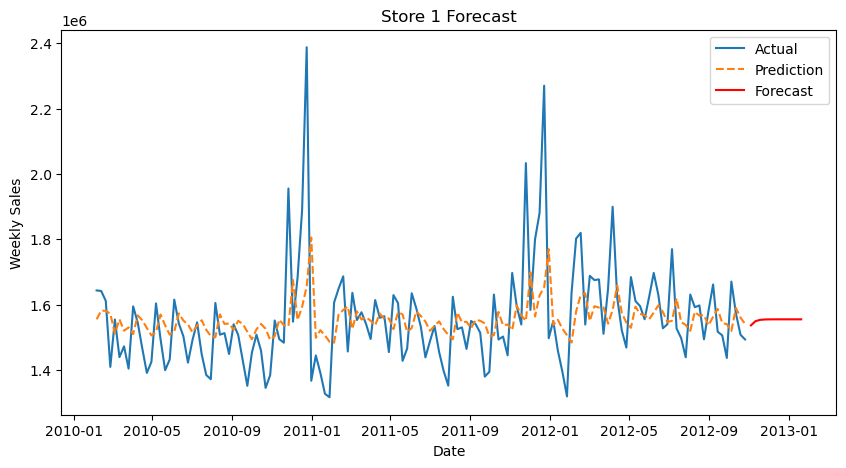

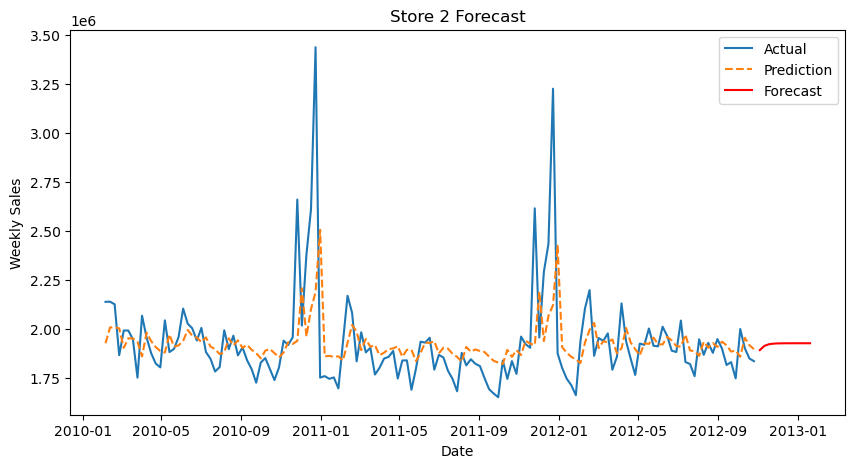

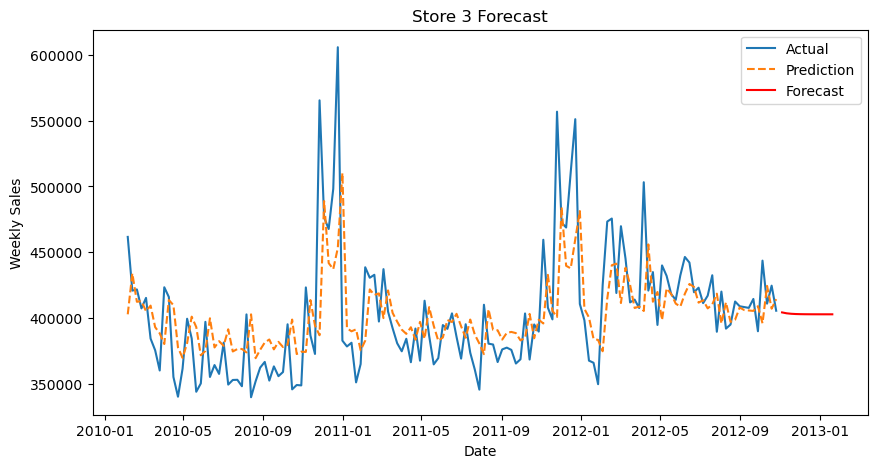

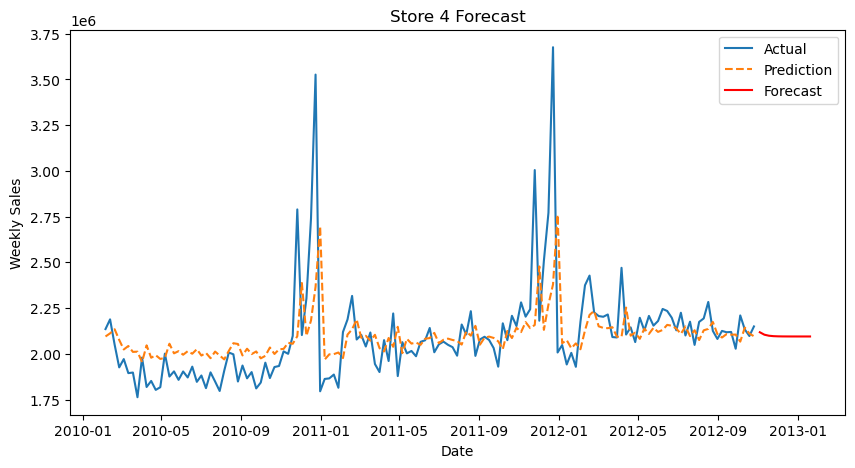

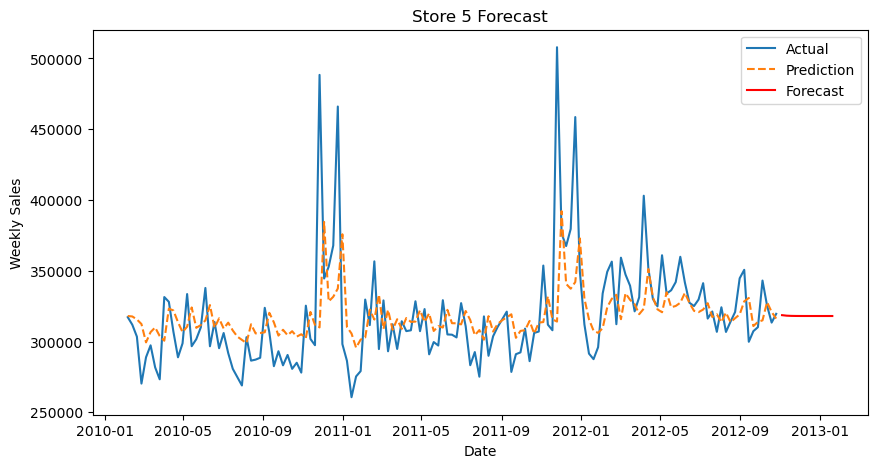

...

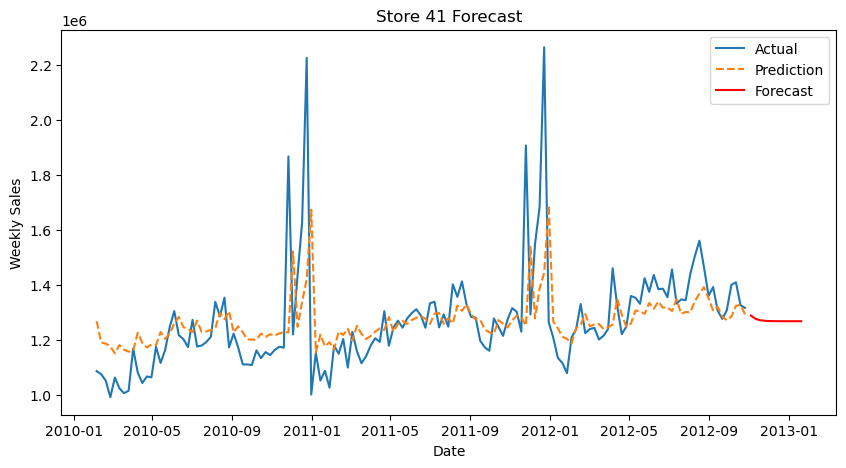

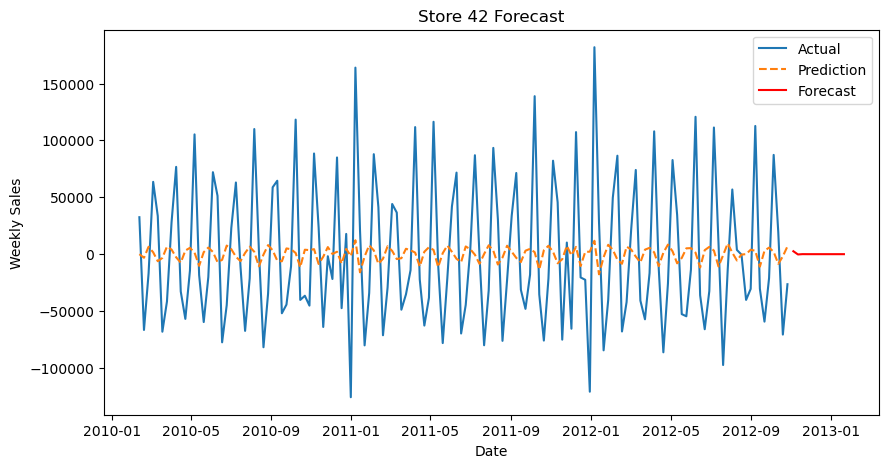

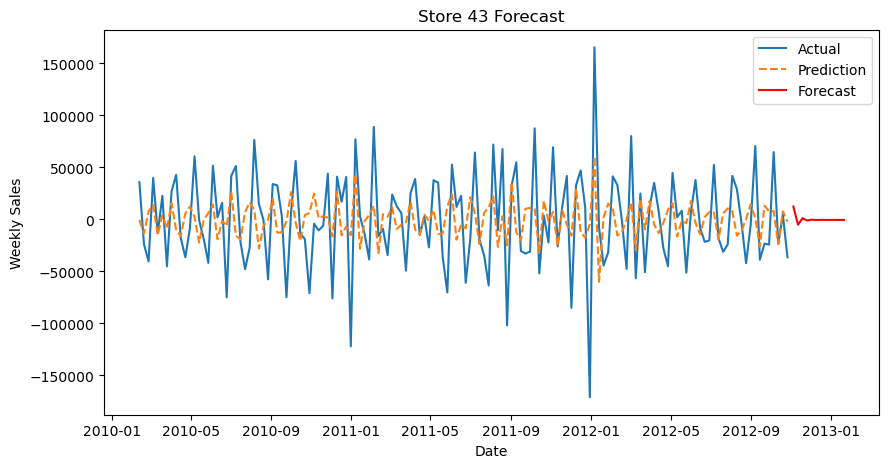

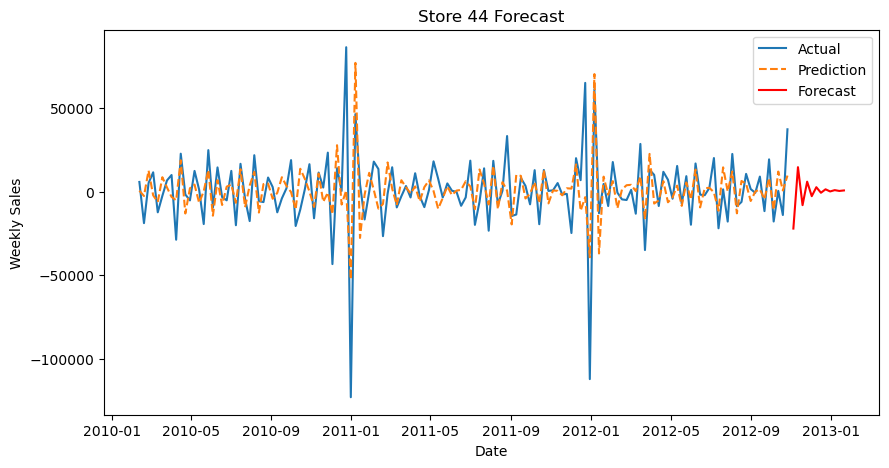

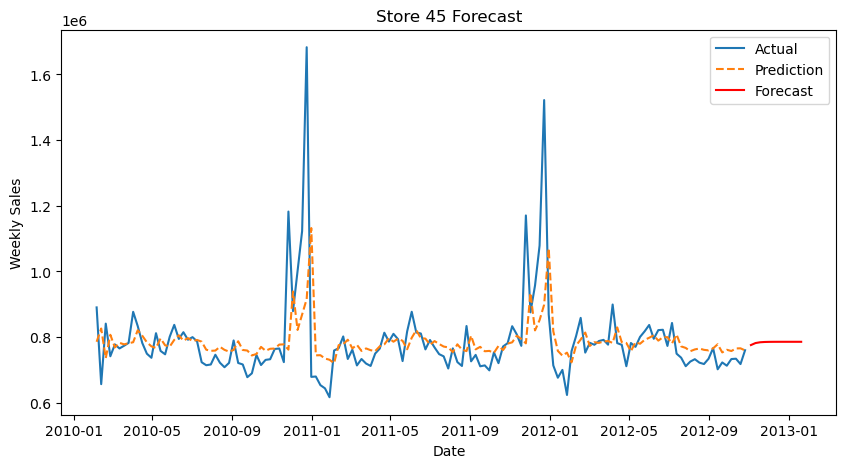

In [277]:
forecasts={}
for store in stationary_df['Store'].unique():
    store_data = stationary_df[stationary_df['Store']==store].sort_index()
    store_data = store_data.asfreq('W-FRI')
    model_fit = train_arima_model(store_data)
    predictions,forecast,future_dates = forecast_store(model_fit,store_data)
    forecasts[store] = forecasts
    plot_results(store,store_data,predictions,forecast,future_dates)

#### **`Evaluating ARIMA Model`**
* Using RMSE and MAE

In [241]:
def evaluate_arima(store_data,predictions):
    actual = store_data['Weekly_Sales']
    mae = mean_absolute_error(actual,predictions)
    rmse = np.sqrt(mean_squared_error(actual,predictions))
    return mae,rmse

In [278]:
forecasts = {}
for store in stationary_df['Store'].unique():
    store_data = stationary_df[stationary_df['Store']==store].sort_index()
    store_data = store_data.asfreq('W-FRI')
    model_fit = train_arima_model(store_data)
    predictions, forecast, future_dates = forecast_store(model_fit, store_data)
    forecasts[store] = forecast
    mae, rmse = evaluate_arima(store_data, predictions)
    print(f"\nStore {store} → MAE: {mae} | RMSE: {rmse}")


Store 1 → MAE: 104436.73395277635 | RMSE: 148186.80625782066

Store 2 → MAE: 128776.31090732163 | RMSE: 218754.1199550691

Store 3 → MAE: 27414.787396992888 | RMSE: 39235.647021558834

Store 4 → MAE: 140359.13628783682 | RMSE: 240284.98855947802

Store 5 → MAE: 21957.465963493643 | RMSE: 34581.94409603385

Store 6 → MAE: 118196.89347983462 | RMSE: 189245.08075881356

Store 7 → MAE: 51773.12471090315 | RMSE: 83095.9942909639

Store 8 → MAE: 59879.27870678287 | RMSE: 98563.47474145245

Store 9 → MAE: 37642.15368392724 | RMSE: 61819.15954559822

Store 10 → MAE: 139826.65153849404 | RMSE: 264599.02651252685

Store 11 → MAE: 98690.52424415936 | RMSE: 151487.76511967988

Store 12 → MAE: 73603.58023051017 | RMSE: 127332.74864287977

Store 13 → MAE: 131506.72019805576 | RMSE: 242927.1149923993

Store 14 → MAE: 172039.57452189093 | RMSE: 295397.1061241242

Store 15 → MAE: 57279.43901129506 | RMSE: 108033.87447454067

Store 16 → MAE: 40804.730436340746 | RMSE: 67611.00543704312

Store 17 → MAE:

**`We performed ARIMA and can show its result but as we know our data show seasonal parteen around winter except some of the store so we will also perform SARIMA to get valid prediction`**

### **`SARIMA`**

In [284]:
def train_sarimax_model(store_data):
    model = SARIMAX(
        store_data['Weekly_Sales'],
        order= (1,0,0),
        seasonal_order=(1,0,0,52))
    model_fit= model.fit(disp=False)
    return model_fit

In [285]:
def forecast_store(model_fit,store_data):
    predictions= model_fit.predict(
        start=0,
        end=len(store_data)-1)
    forecast = model_fit.forecast(steps=12)
    future_dates = pd.date_range(start = store_data.index[-1],periods=13,freq='W')[1:]
    return predictions,forecast,future_dates

In [286]:
def plot_results(store, store_data, predictions, forecast, future_dates):
    plt.figure(figsize=(10,5))
    plt.plot(store_data.index, store_data['Weekly_Sales'], label='Actual Sales')
    plt.plot(store_data.index, predictions, label='Model Prediction', linestyle='--')
    plt.plot(future_dates, forecast, label='Forecast (Next 12 Weeks)', color='red')
    plt.title(f"Store {store} SARIMAX Forecast")
    plt.xlabel("Date")
    plt.ylabel("Weekly Sales")
    plt.legend()
    plt.show()

In [287]:
def evaluate_sarima(store_data,predictions):
    actual = store_data['Weekly_Sales']
    mae = mean_absolute_error(actual,predictions)
    rmse = np.sqrt(mean_squared_error(actual,predictions))
    return mae,rmse

Store 1 → 
    MAE: 100273.64208384929 | RMSE: 197598.74518409427
    


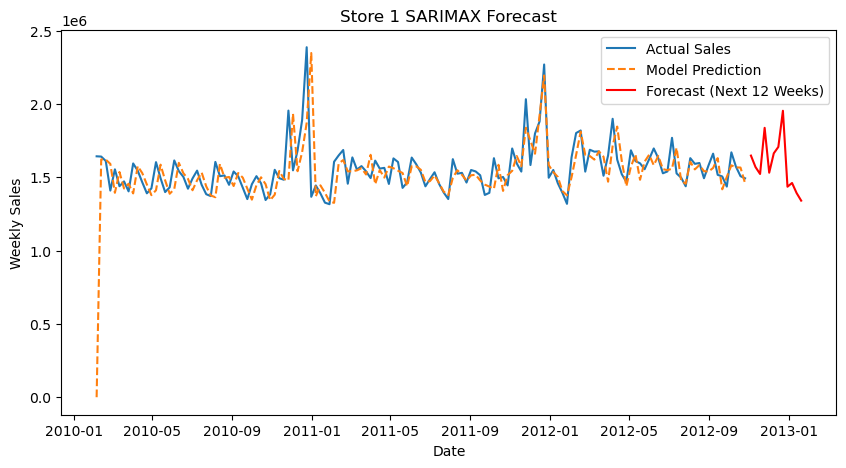

Store 2 → 
    MAE: 122262.09122753888 | RMSE: 270597.68901130604
    


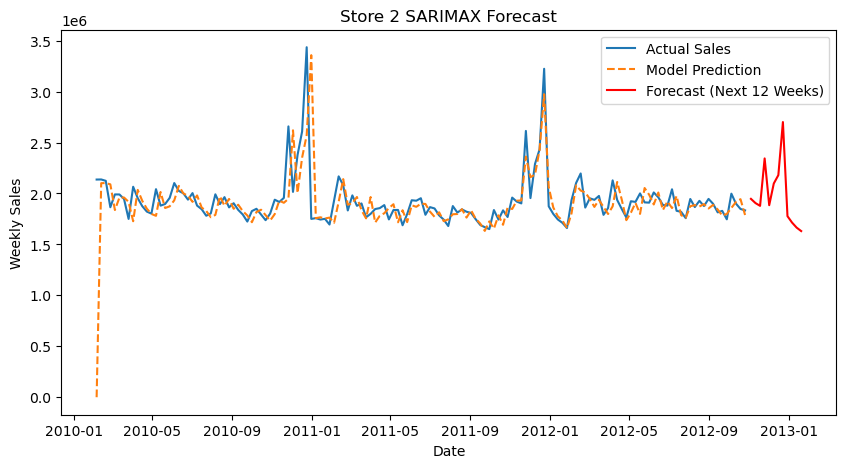

Store 3 → 
    MAE: 26219.24627066853 | RMSE: 53638.66424882543
    


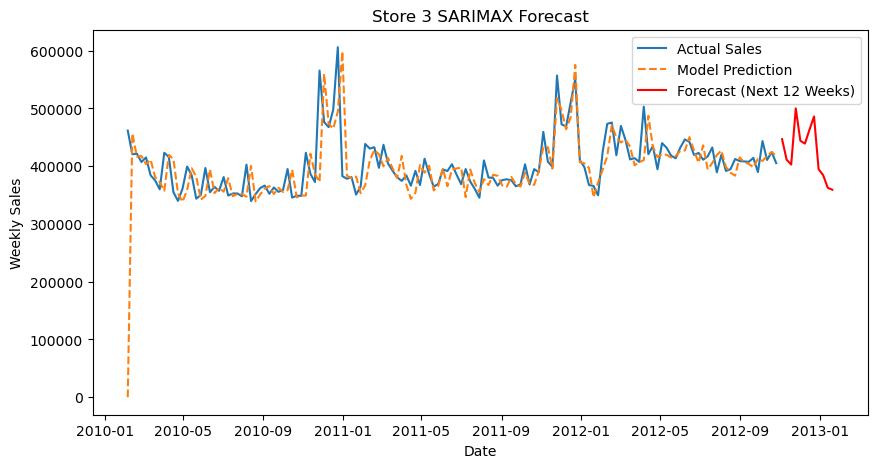

Store 4 → 
    MAE: 128821.63160663837 | RMSE: 279222.37217098725
    


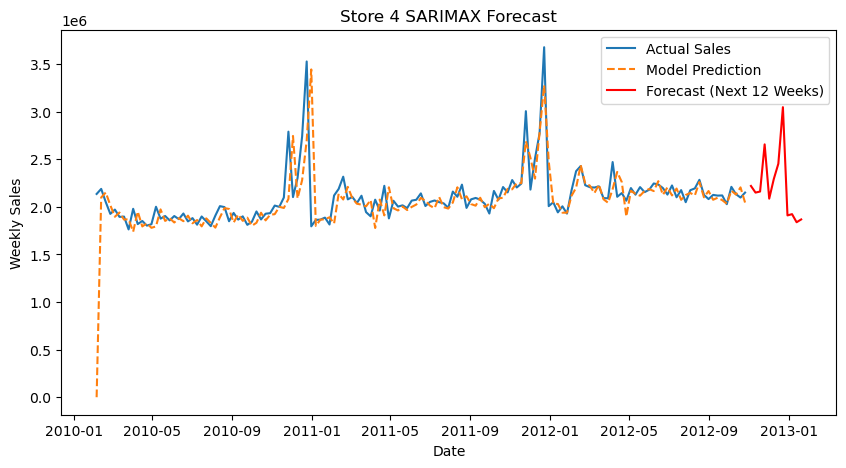

Store 5 → 
    MAE: 21628.26895915425 | RMSE: 42235.33859305193
    


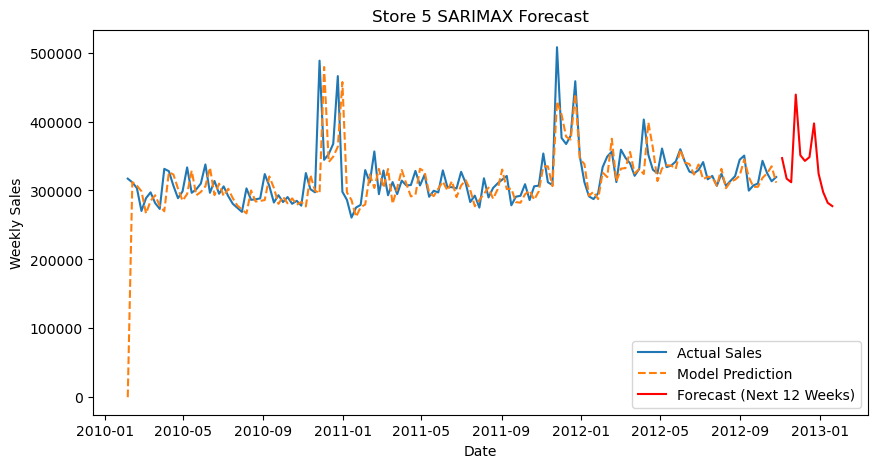

Store 6 → 
    MAE: 106763.0479022683 | RMSE: 219832.3110212654
    


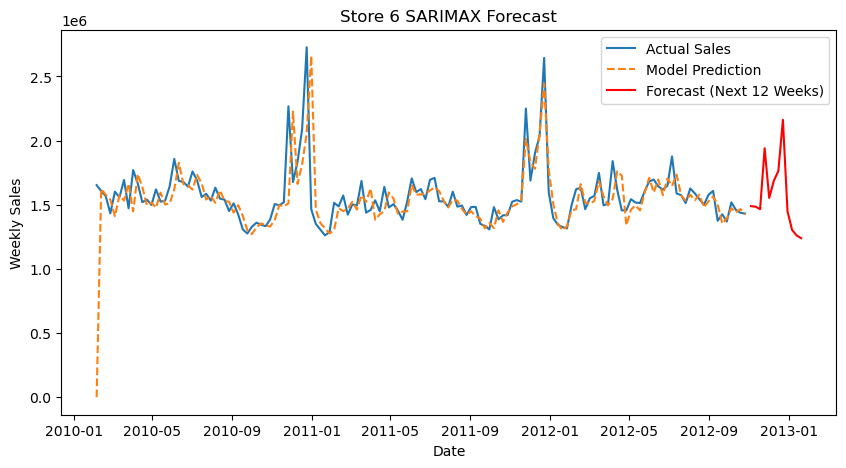

Store 7 → 
    MAE: 42674.2834358287 | RMSE: 79434.49516316928
    


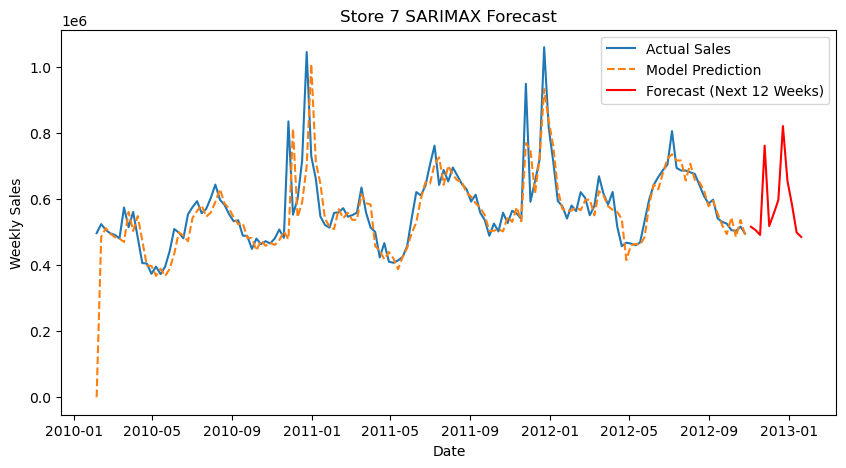

Store 8 → 
    MAE: 55871.52355949306 | RMSE: 124307.5707095334
    


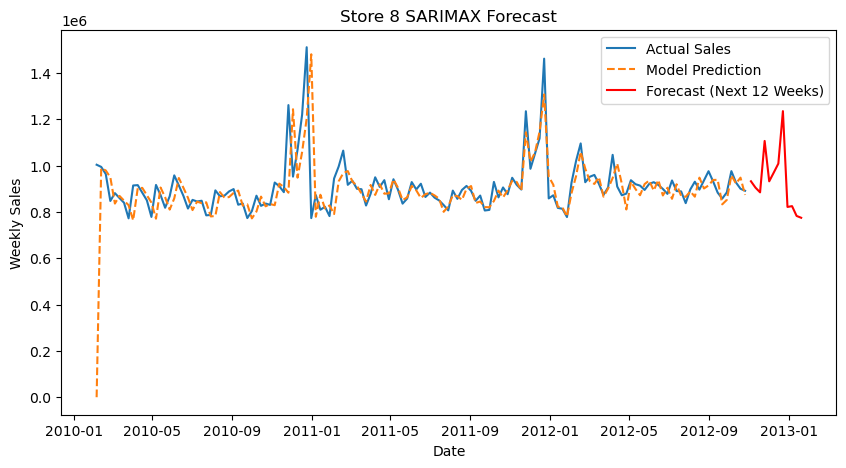

Store 9 → 
    MAE: 35470.94796427212 | RMSE: 72129.77146652629
    


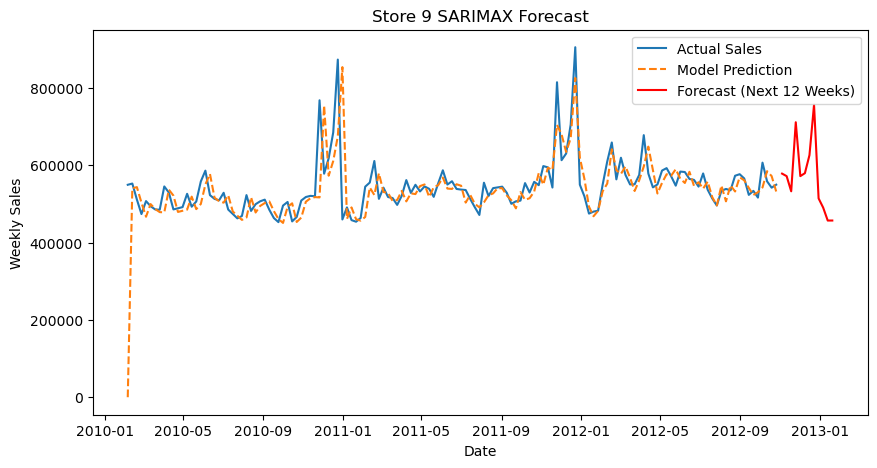

Store 10 → 
    MAE: 125445.80552091304 | RMSE: 300076.8848482572
    


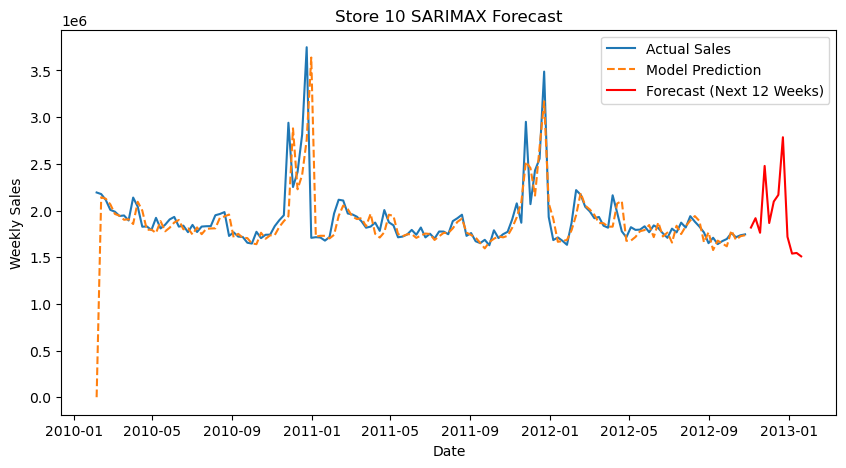

Store 11 → 
    MAE: 90594.06732915709 | RMSE: 190698.96966226917
    


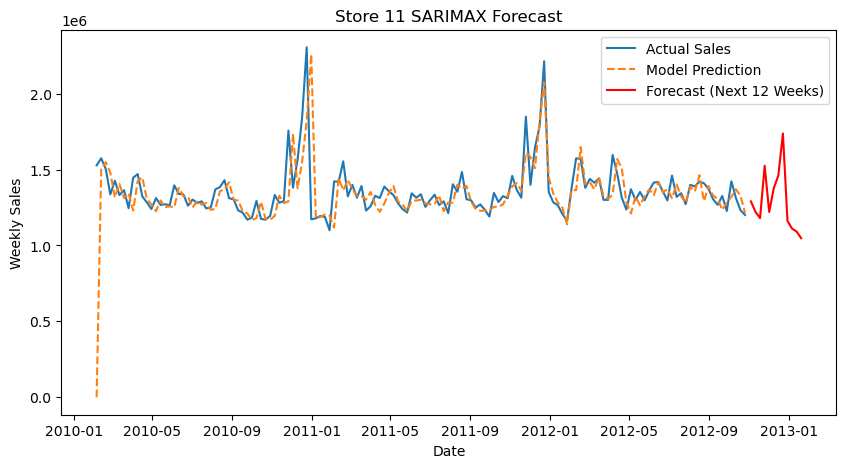

Store 12 → 
    MAE: 64732.34432171086 | RMSE: 152487.32998448366
    


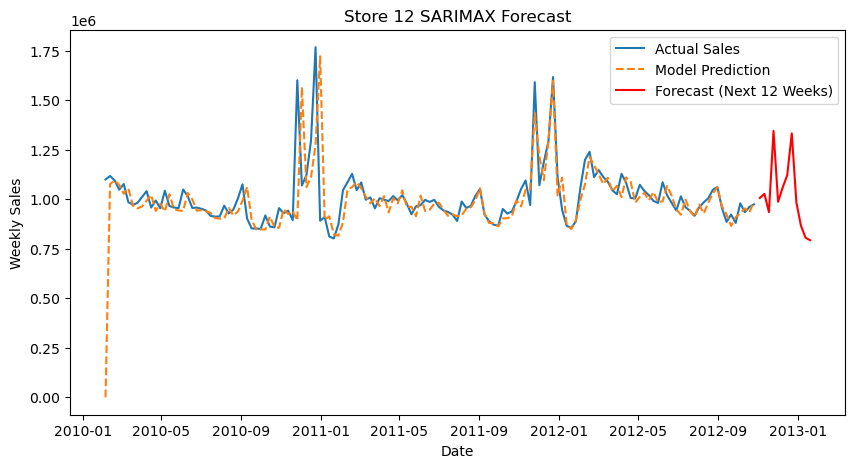

Store 13 → 
    MAE: 131669.25687563847 | RMSE: 278774.5702317206
    


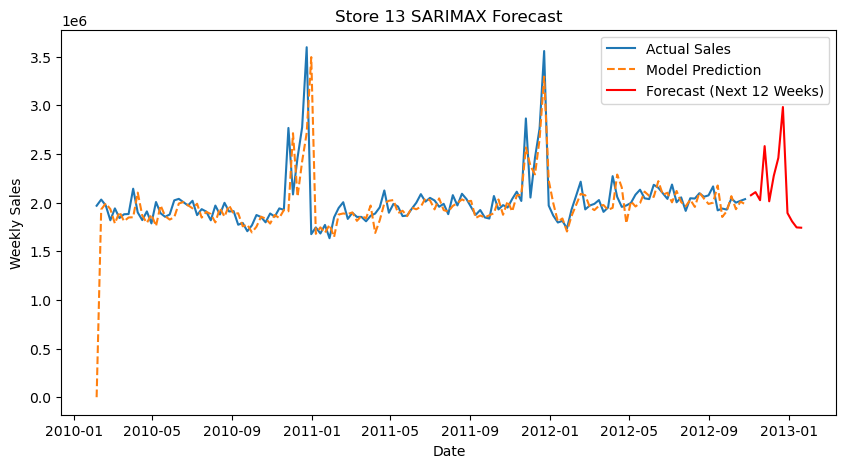

Store 14 → 
    MAE: 142738.32667489757 | RMSE: 259296.4257271383
    


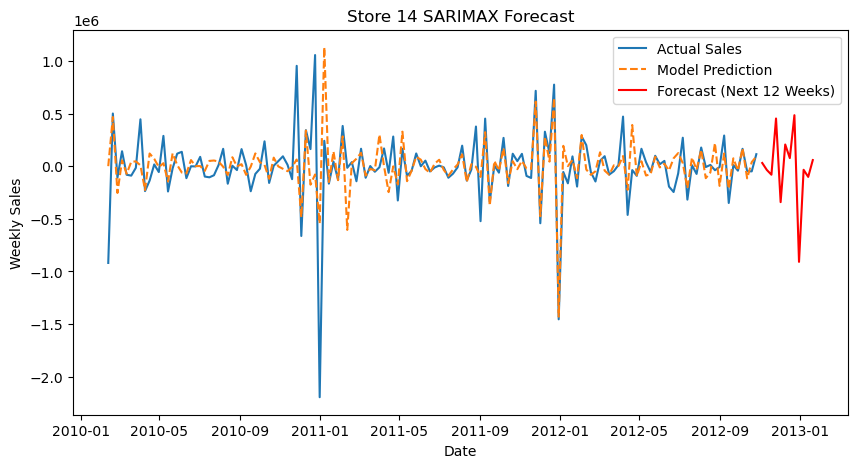

Store 15 → 
    MAE: 54385.623902235 | RMSE: 114889.7228995111
    


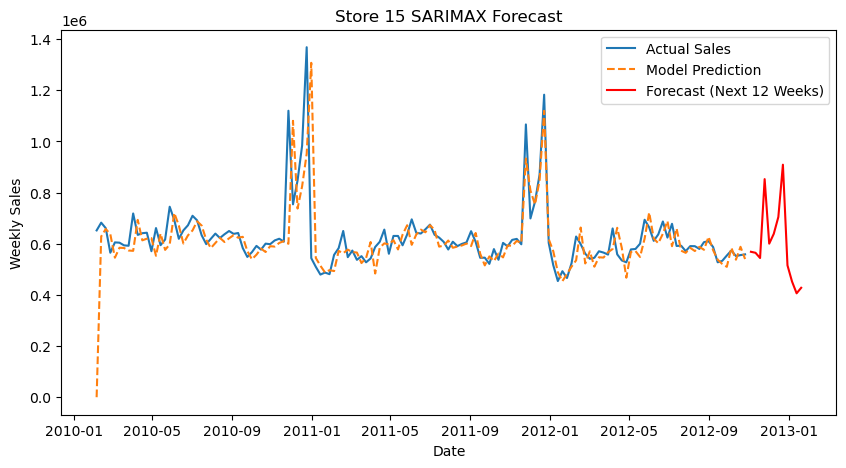

Store 16 → 
    MAE: 35880.9496030932 | RMSE: 72032.97461091312
    


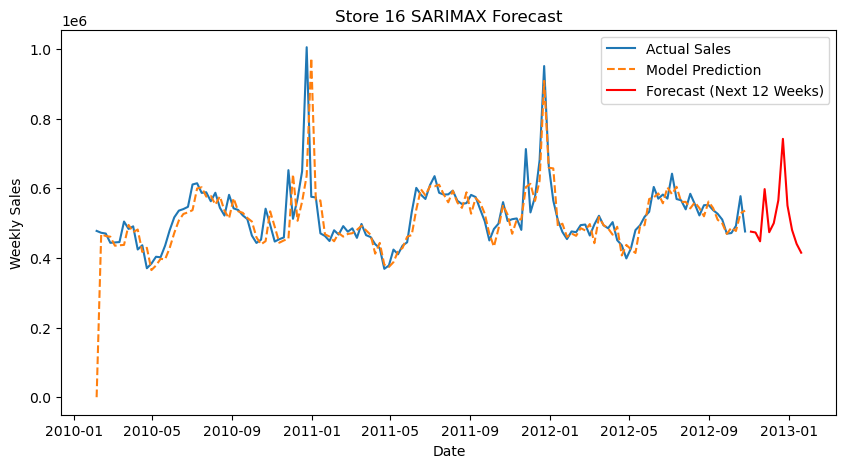

Store 17 → 
    MAE: 66551.4555125074 | RMSE: 124601.48169630338
    


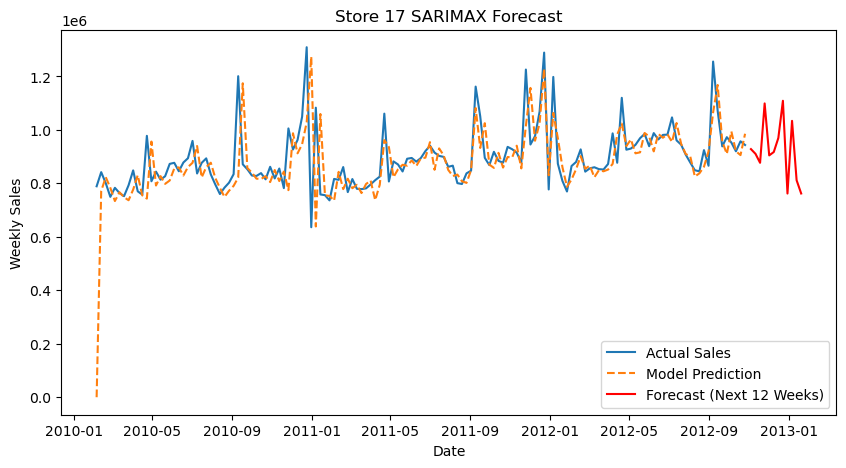

Store 18 → 
    MAE: 93599.91090463777 | RMSE: 187751.758478602
    


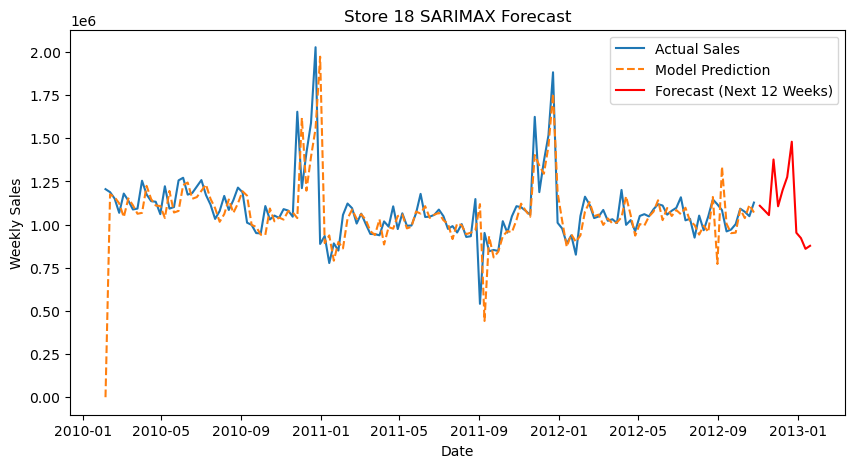

Store 19 → 
    MAE: 103448.88532108079 | RMSE: 212599.65404769627
    


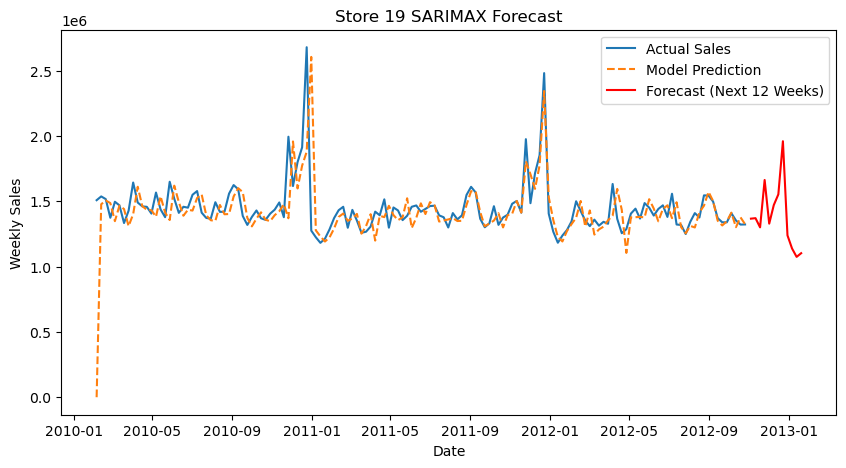

Store 20 → 
    MAE: 157424.91950810404 | RMSE: 321534.04173933464
    


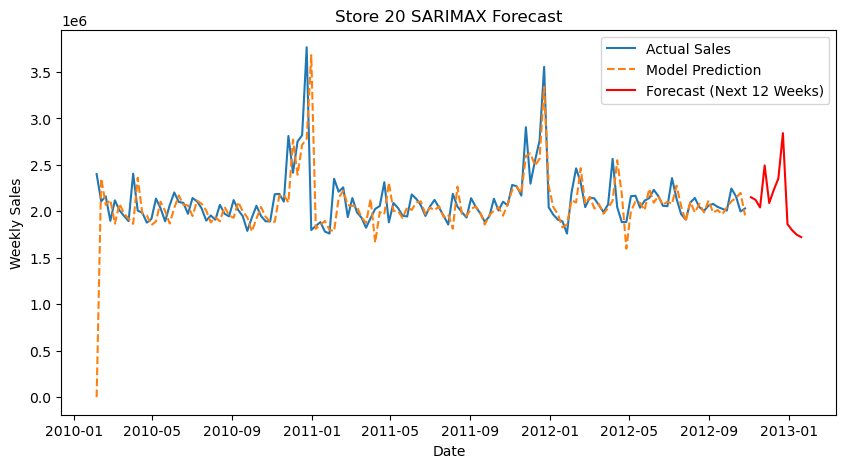

Store 21 → 
    MAE: 56150.12144113434 | RMSE: 128081.86205061778
    


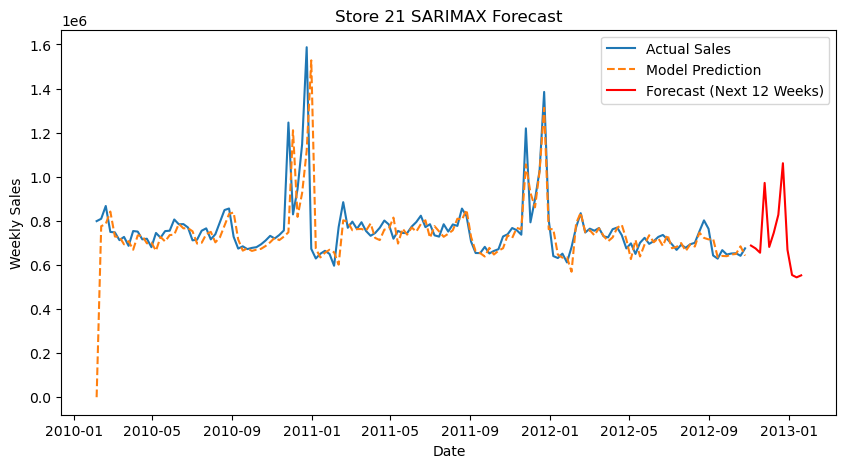

Store 22 → 
    MAE: 80851.56330523377 | RMSE: 164982.21736660355
    


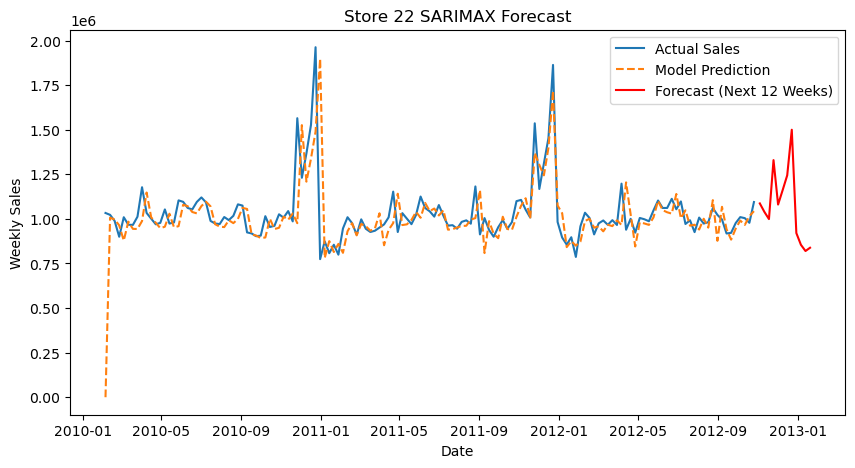

Store 23 → 
    MAE: 126867.34090710116 | RMSE: 227568.82427429024
    


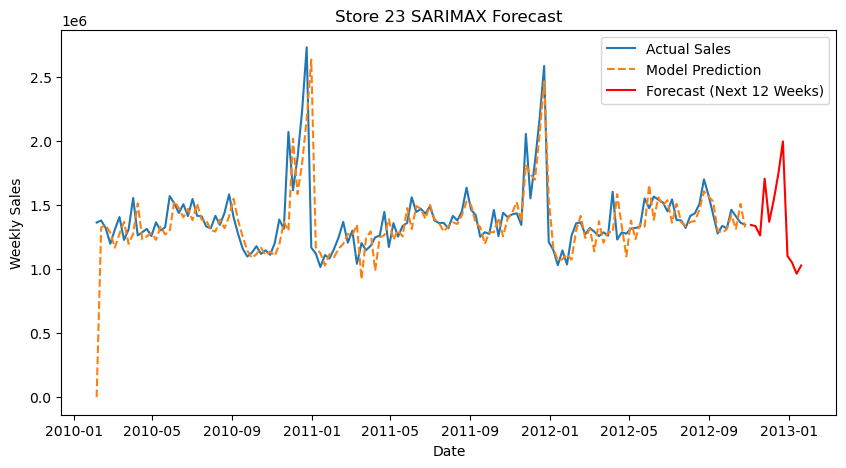

Store 24 → 
    MAE: 106436.98121510503 | RMSE: 196935.1671203123
    


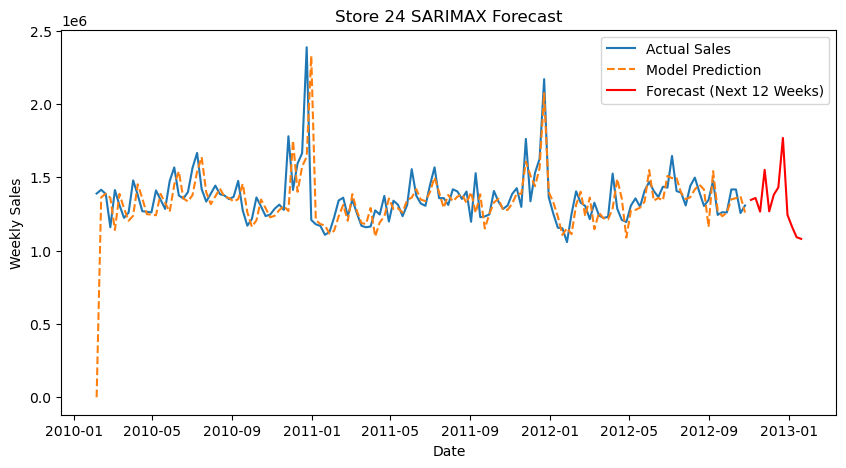

Store 25 → 
    MAE: 48503.135054599785 | RMSE: 100667.53027137149
    


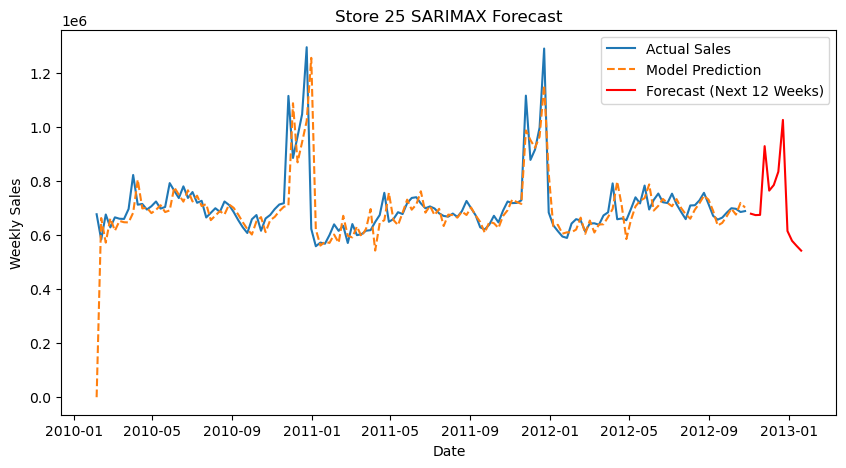

Store 26 → 
    MAE: 69960.25987128646 | RMSE: 132227.32320568053
    


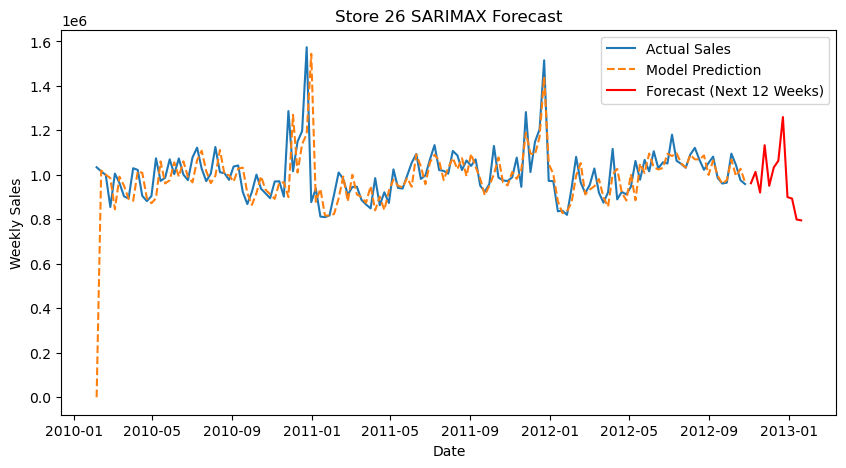

Store 27 → 
    MAE: 145485.3175332976 | RMSE: 278628.4532760363
    


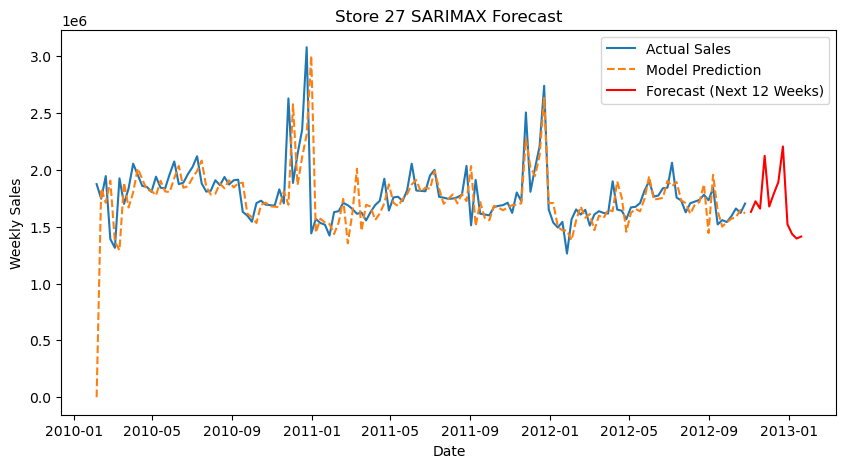

Store 28 → 
    MAE: 136250.57759545813 | RMSE: 235510.7062372075
    


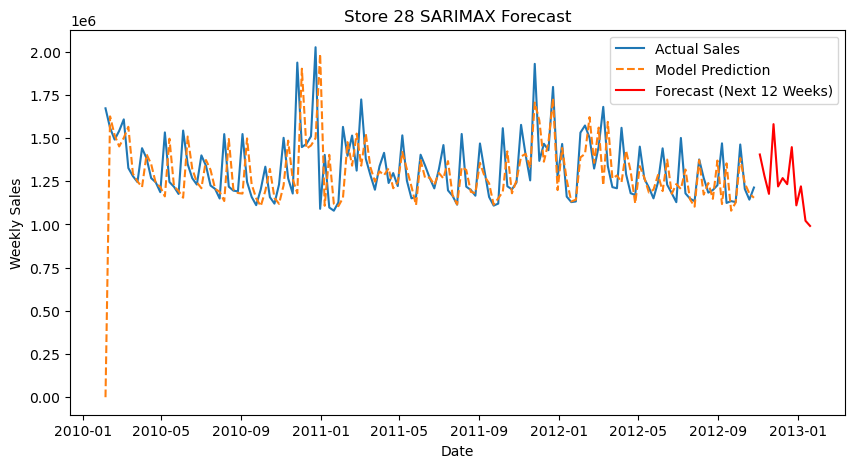

Store 29 → 
    MAE: 49202.43357291268 | RMSE: 98604.92086792854
    


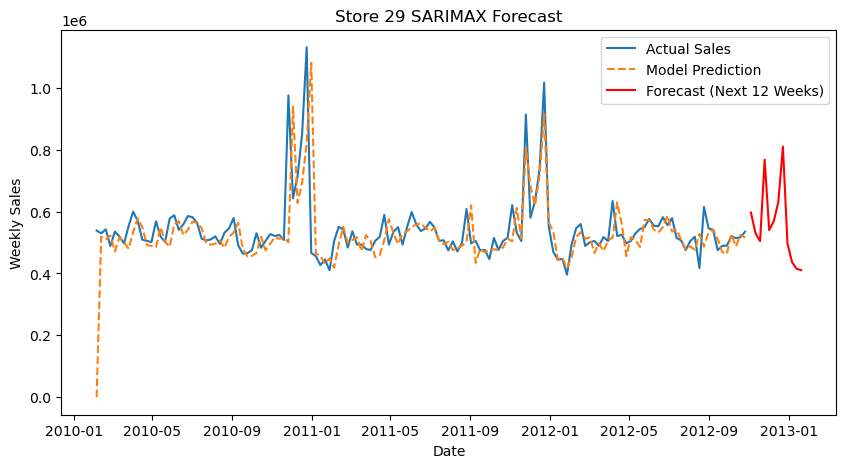

Store 30 → 
    MAE: 12970.756762933492 | RMSE: 19330.952780424483
    


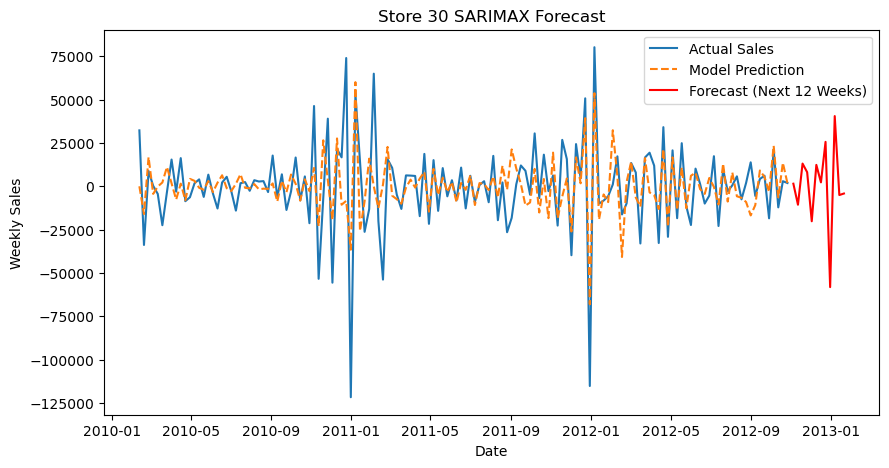

Store 31 → 
    MAE: 73666.77045105009 | RMSE: 169560.59835847153
    


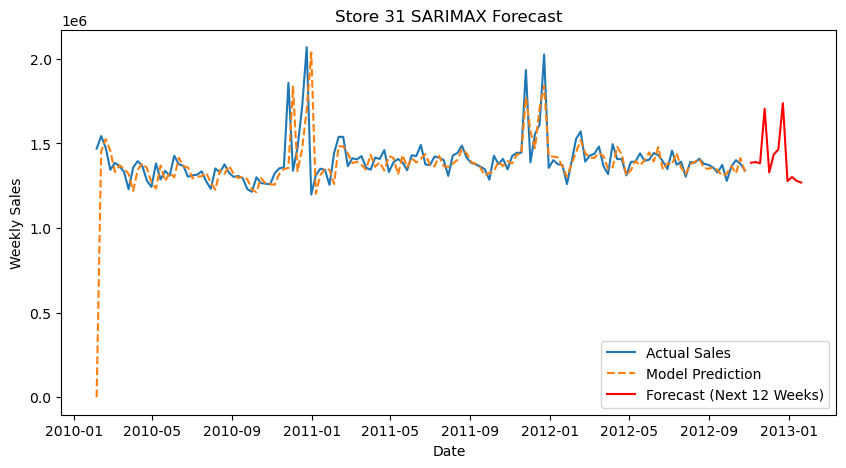

Store 32 → 
    MAE: 67658.6575343418 | RMSE: 149067.48455434848
    


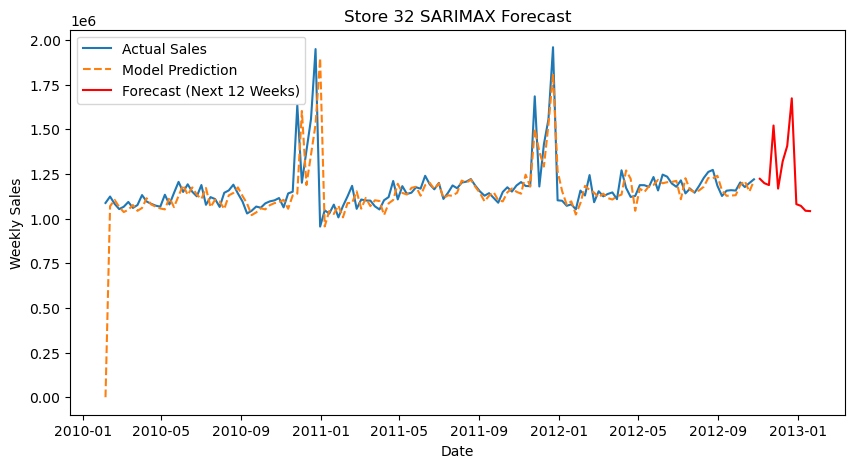

Store 33 → 
    MAE: 16989.07143814837 | RMSE: 29697.560732167865
    


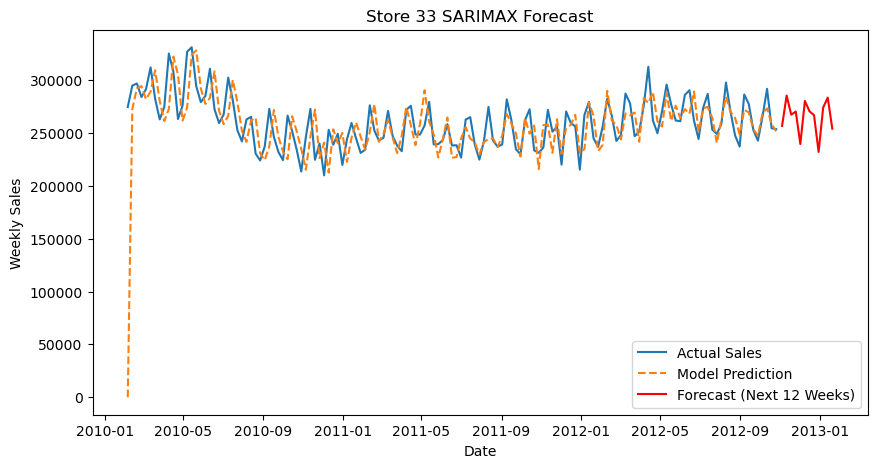

Store 34 → 
    MAE: 55778.84867829975 | RMSE: 123314.8410262073
    


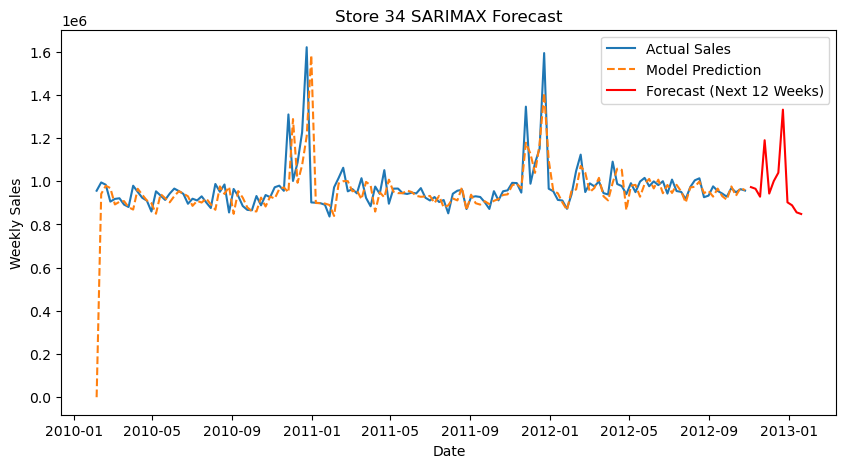

Store 35 → 
    MAE: 91569.75791257416 | RMSE: 195567.99711745523
    


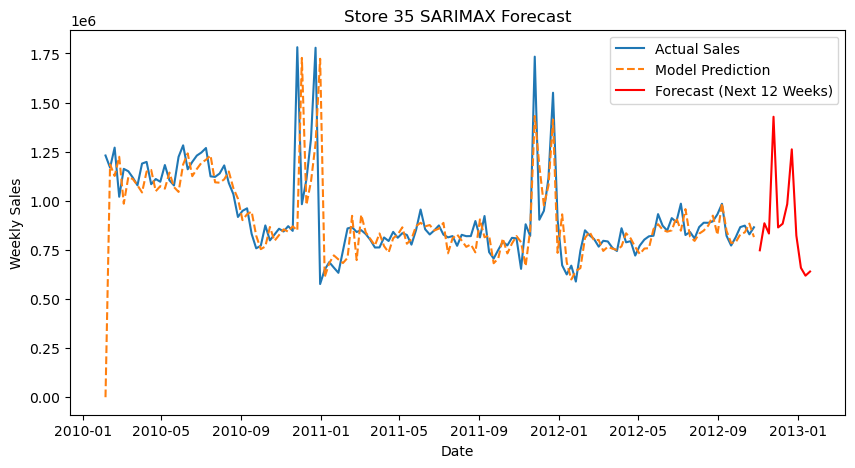

Store 36 → 
    MAE: 15936.421701248564 | RMSE: 19885.27220454258
    


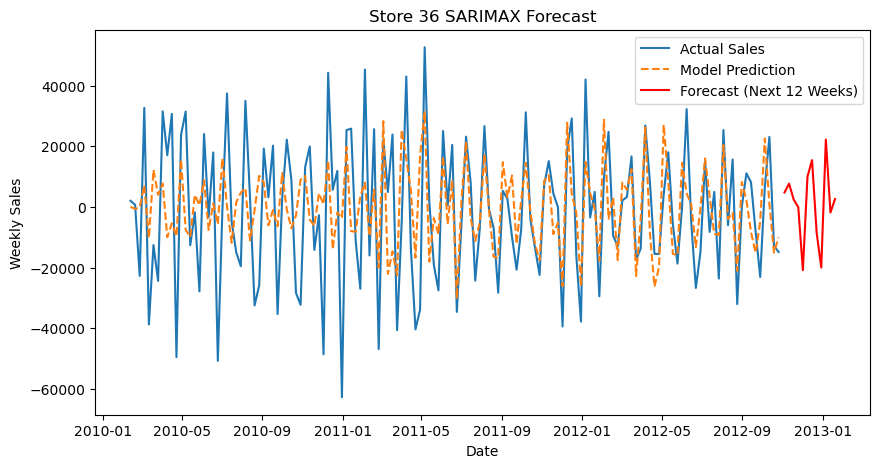

Store 37 → 
    MAE: 21389.363504913897 | RMSE: 51398.822257790656
    


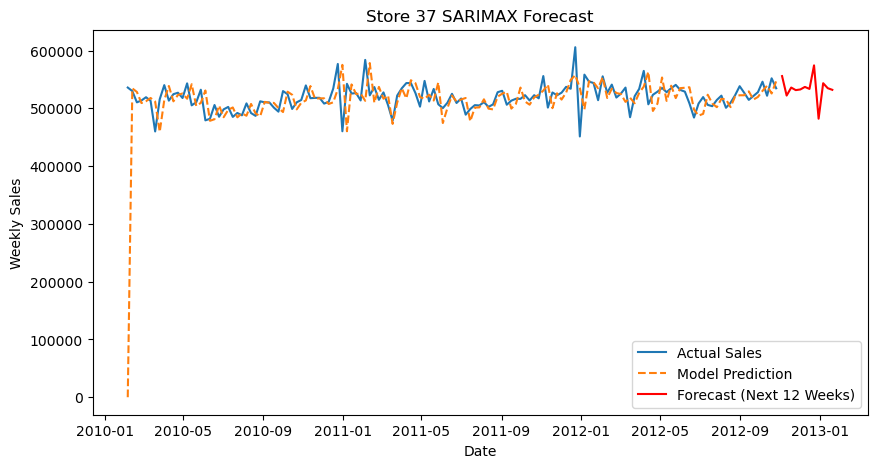

Store 38 → 
    MAE: 20303.646462703025 | RMSE: 26059.393200504262
    


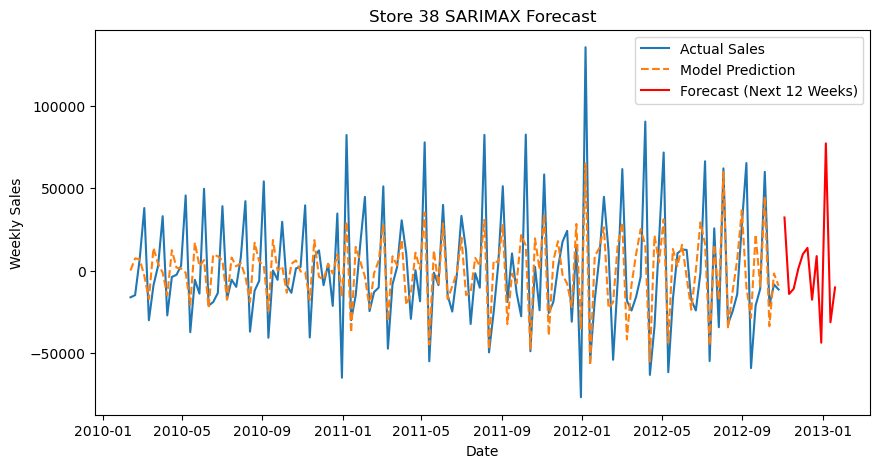

Store 39 → 
    MAE: 97156.81664764056 | RMSE: 199270.37387642448
    


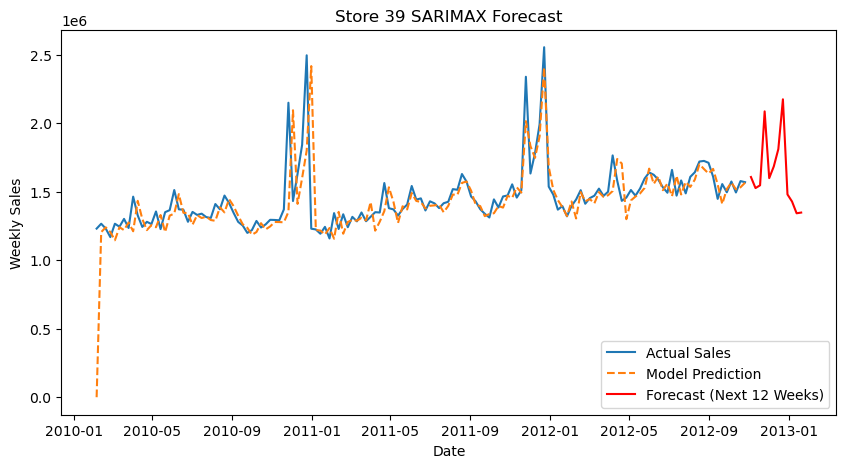

Store 40 → 
    MAE: 74676.35214230177 | RMSE: 139010.78592945207
    


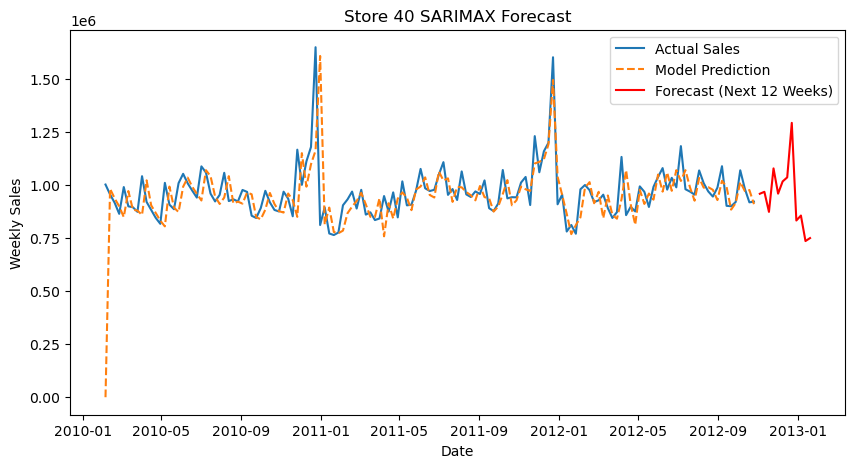

Store 41 → 
    MAE: 85448.61229367282 | RMSE: 179401.97826416616
    


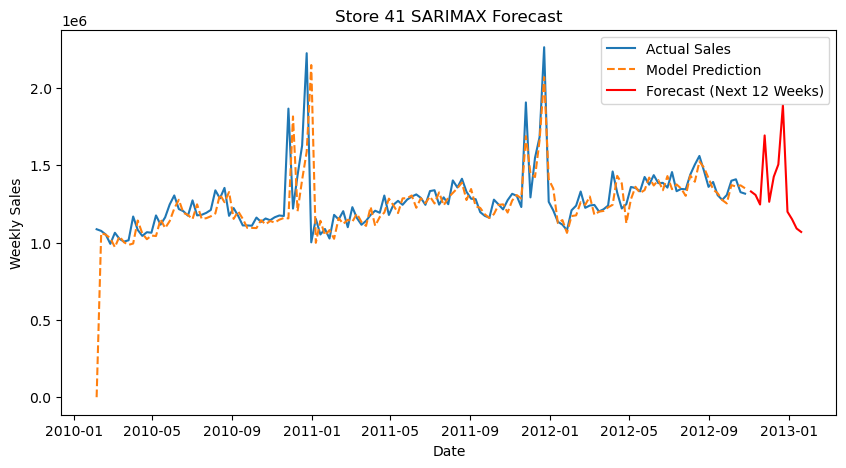

Store 42 → 
    MAE: 35878.42571252654 | RMSE: 44977.14811765278
    


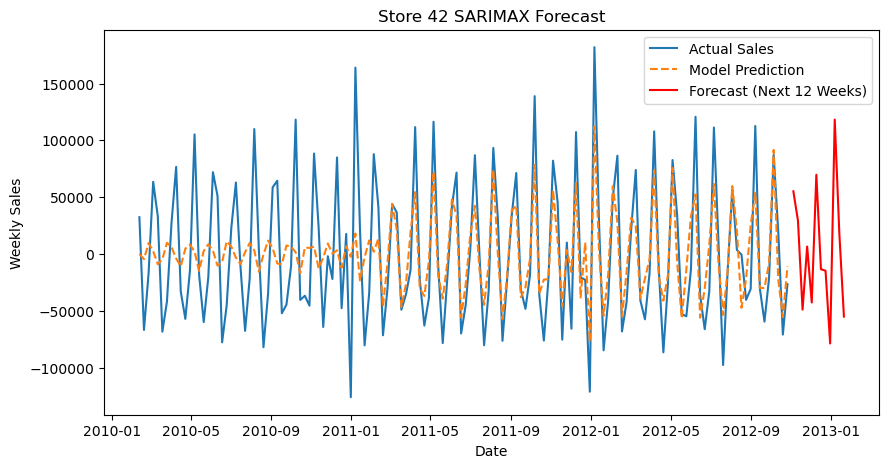

Store 43 → 
    MAE: 26237.66159594035 | RMSE: 34291.417851724305
    


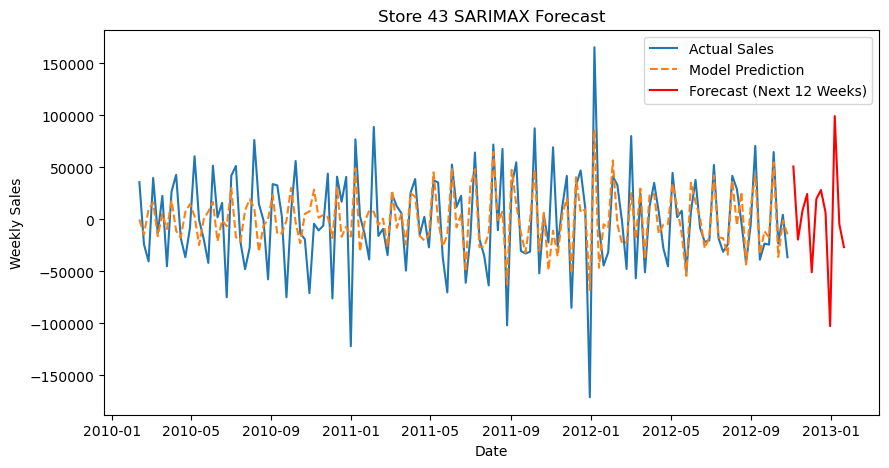

Store 44 → 
    MAE: 11195.919392641976 | RMSE: 15647.703965847923
    


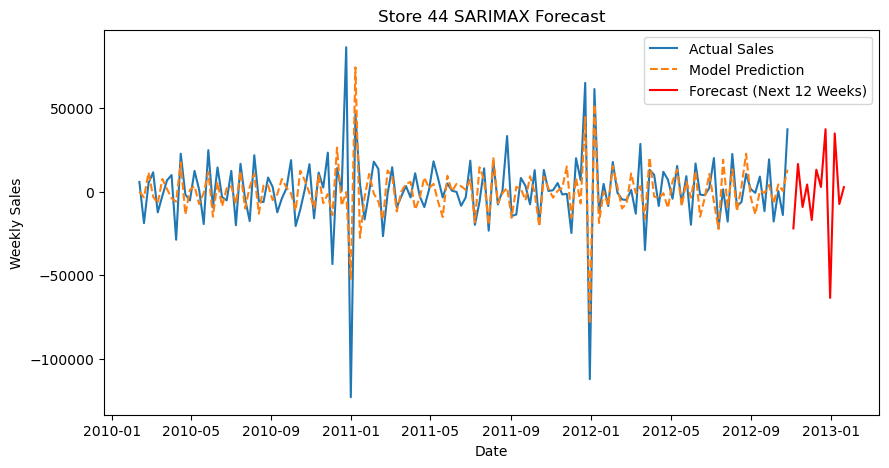

Store 45 → 
    MAE: 63309.38148711465 | RMSE: 139536.79214374308
    


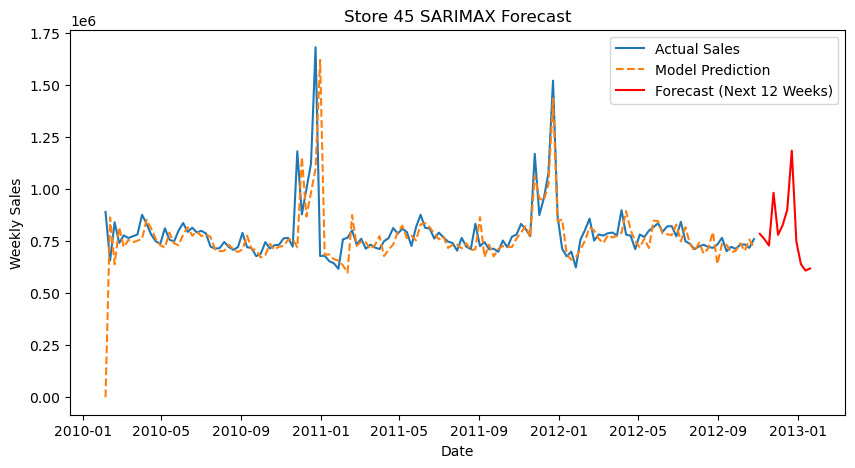

In [288]:
forecasts={}
for store in stationary_df['Store'].unique():
    store_data = stationary_df[stationary_df['Store']==store].sort_index()
    store_data = store_data.asfreq('W-FRI')
    model_fit = train_sarimax_model(store_data)
    predictions,forcast,future_dates = forecast_store(model_fit,store_data)
    forecasts[store] = forecast
    mae,rmse = evaluate_sarima(store_data,predictions)
    print(f'''Store {store} → 
    MAE: {mae} | RMSE: {rmse}
    ''')
    plot_results(store,store_data,predictions,forcast,future_dates)

**`AS we see here SARIMAX Follows the perfect seasonality better than ARIMA`**

**`Lets Compare BOTH ARIMA And SARIMA Models Which store is best suitable for best model`**

In [289]:
results = []   # create empty list

for store in stationary_df['Store'].unique():

    store_data = stationary_df[stationary_df['Store']==store].sort_index()

    store_data = store_data.asfreq('W-FRI') # Every friday week is ended

    train = store_data.iloc[:-12]
    test = store_data.iloc[-12:]

    # ARIMA
    arima_model = ARIMA(train['Weekly_Sales'], order=(1,0,0))
    arima_fit = arima_model.fit()

    arima_pred = arima_fit.forecast(steps=12)

    # SARIMA
    sarima_model = SARIMAX(train['Weekly_Sales'], order=(1,0,0), seasonal_order=(1,0,0,52))
    sarima_fit = sarima_model.fit(disp=False)

    sarima_pred = sarima_fit.forecast(steps=12)

    # Metrics
    arima_mae = mean_absolute_error(test['Weekly_Sales'], arima_pred)
    arima_rmse = np.sqrt(mean_squared_error(test['Weekly_Sales'], arima_pred))

    sarima_mae = mean_absolute_error(test['Weekly_Sales'], sarima_pred)
    sarima_rmse = np.sqrt(mean_squared_error(test['Weekly_Sales'], sarima_pred))

    results.append({
        "Store": store,
        "ARIMA_MAE": arima_mae,
        "ARIMA_RMSE": arima_rmse,
        "SARIMA_MAE": sarima_mae,
        "SARIMA_RMSE": sarima_rmse
    })

In [290]:
results_df = pd.DataFrame(results)
results_df['Best_Model'] = results_df.apply(
    lambda row: 'ARIMA' if row['ARIMA_RMSE'] < row['SARIMA_RMSE'] else 'SARIMA',
    axis=1
)

results_df

,Store,ARIMA_MAE,ARIMA_RMSE,SARIMA_MAE,SARIMA_RMSE,Best_Model
0,1,57719.439969,67692.264303,75845.151923,89048.501101,ARIMA
1,2,71173.970531,85696.279338,106559.310952,123040.240777,ARIMA
2,3,12979.388009,16550.771941,28303.835391,32092.730741,ARIMA
3,4,55370.323890,72624.502021,120948.249983,130098.319635,ARIMA
4,5,12971.973459,16379.704079,19970.345612,22918.067870,ARIMA
5,6,95853.969203,116773.670312,66068.668759,74966.187800,SARIMA
6,7,40548.495905,47148.368687,9701.476856,12160.790912,SARIMA
7,8,30666.981377,36446.451141,76256.625160,82291.546590,ARIMA
8,9,19697.346294,26047.410287,58137.811801,62168.653131,ARIMA
9,10,183920.229208,194926.436419,62108.109849,74241.427442,SARIMA


In [291]:
results_df.describe()

,Store,ARIMA_MAE,ARIMA_RMSE,SARIMA_MAE,SARIMA_RMSE
count,45.000000,45.000000,45.000000,45.000000,45.000000
mean,23.000000,58498.678478,70022.052326,70384.125094,79810.285999
std,13.133926,39825.697115,45795.932628,46426.232183,50804.029022
min,1.000000,8645.932008,10591.880430,8829.114293,10825.582774
25%,12.000000,28405.725782,35403.753311,28303.835391,34066.604329
50%,23.000000,54823.488610,60890.583389,66068.668759,77055.907511
75%,34.000000,76282.003524,85696.279338,98127.504045,122560.802026
max,45.000000,183920.229208,194926.436419,196758.218461,213618.214636


* **On an average SARIMA_RMSE is greater than ARIMA_RMSE so the best model here is ARIMA because it shows less error.**
* **But SARIMA capture seasonal pattern.**
* **ARIMA will be final model for forcasting.**